# Circuit Performance Over Training - All Pythia Scales

In [1]:
from IPython import get_ipython

ipython = get_ipython()
# Code to automatically update the HookedTransformer code as its edited without restarting the kernel
ipython.magic("load_ext autoreload")
ipython.magic("autoreload 2")

/tmp/ipykernel_43/4115428919.py:5: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipython.magic("load_ext autoreload")
/tmp/ipykernel_43/4115428919.py:6: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipython.magic("autoreload 2")


In [2]:
import os
import torch
import pandas as pd
import plotly.express as px
import transformer_lens.utils as utils

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

In [3]:
torch.set_grad_enabled(False)

In [4]:
# =============================================================================
#pio.renderers.default = 'png' # USE IF MAKING GRAPHS FOR NOTEBOOK EXPORT
# =============================================================================

In [5]:
from neel_plotly import line, imshow, scatter

def l_imshow(tensor, renderer=None, **kwargs):
    px.imshow(utils.to_numpy(tensor), color_continuous_midpoint=0.0, color_continuous_scale="RdBu", **kwargs).show(renderer)

def l_line(tensor, renderer=None, width=1200, height=500, **kwargs):
    fig = px.line(y=utils.to_numpy(tensor), **kwargs)
    fig.update_layout(
        autosize=False,
        width=width,
        height=height
    )
    fig.show(renderer=renderer)

def l_scatter(x, y, xaxis="", yaxis="", caxis="", renderer=None, **kwargs):
    x = utils.to_numpy(x)
    y = utils.to_numpy(y)
    px.scatter(y=y, x=x, labels={"x":xaxis, "y":yaxis, "color":caxis}, **kwargs).show(renderer)

def two_lines(tensor1, tensor2, renderer=None, **kwargs):
    px.line(y=[utils.to_numpy(tensor1), utils.to_numpy(tensor2)], **kwargs).show(renderer)

In [6]:
def get_checkpoint_names(mode: str = "linear"):
    if mode == "linear":
        ckpts = [i * 1000 for i in range(1, 144)]
    elif mode == "exponential":
        ckpts = [
            round((2**i) / 1000) * 1000 if 2**i > 1000 else 2**i
            for i in range(18)
        ]
    elif mode == "exp_plus_detail":
        ckpts = (
            [2**i for i in range(10)]
            + [i * 1000 for i in range(1, 16)]
            + [i * 5000 for i in range(4, 14)]
            + [i * 10000 for i in range(7, 15)]
            + [143000]
        )
    else:
        ckpts = [1, 2]

    return ckpts

In [7]:
def plot_lines(data_series, labels, colors, x_vals, x_title='X', y_title='Y', title='Line plot', log=True):
    fig = go.Figure()

    for series, label, color in zip(data_series, labels, colors):
        fig.add_trace(go.Scatter(x=x_vals, y=series, mode='lines', name=label, line=dict(color=color)))
    type = 'log' if log else 'linear'
    fig.update_xaxes(type=type, title=x_title)
    fig.update_yaxes(title=y_title)
    fig.update_layout(title=title, width=1200, height=500)

    fig.show()

    import plotly.express as px

import plotly.graph_objects as go



In [8]:
def rescale_tensor(tensor):
    """
    Rescales a tensor with values usually between 0.5 and 1 to be between 0 and 1.

    Args:
        tensor (torch.Tensor): The tensor to be rescaled.

    Returns:
        torch.Tensor: The rescaled tensor.
    """
    # Find the minimum and maximum values in the tensor
    min_val = tensor.min()
    max_val = tensor.max()

    # Normalize the tensor to a range of 0 to 1
    if max_val - min_val > 0:
        rescaled_tensor = (tensor - min_val) / (max_val - min_val)
    else:
        # Handle the case where all values in the tensor are the same
        rescaled_tensor = torch.zeros_like(tensor)

    return rescaled_tensor

In [9]:
from sklearn.linear_model import LinearRegression
import numpy as np
import os
import torch

def moving_average(input_tensor, window_size):
    """Calculate the moving average with a given window size."""
    # Prepend a zero to the input_tensor
    padded_input = torch.cat([torch.zeros(1, device=input_tensor.device), input_tensor])
    cumsum_vec = torch.cumsum(padded_input, dim=0)
    moving_avg = (cumsum_vec[window_size:] - cumsum_vec[:-window_size]) / window_size
    print(moving_avg)
    print(moving_avg.shape)
    return moving_avg


def get_start(input_tensor, START_THRESHOLD, END_THRESHOLD, window_size=5):
    """
    Adjust the function to use the rolling average of the last n "differences" 
    to calculate the end_index.

    Args:
        input_tensor (torch.Tensor): Input tensor.
        START_THRESHOLD (float): Threshold to detect the start.
        END_THRESHOLD (float): Threshold to detect the end.
        window_size (int): Window size for the rolling average calculation.

    Returns:
        tuple: A tuple containing the start and end indices.
    """
    differences = input_tensor[1:] - input_tensor[:-1]
    print(differences)

    # Find start index
    start_indices = torch.nonzero(differences > START_THRESHOLD).view(-1)
    first_index = start_indices[0].item() if len(start_indices) > 0 else None

    if first_index is not None and first_index + window_size <= len(differences):
        rolled_differences = moving_average(differences[first_index:], window_size)
        # Adjust indices to match the original differences tensor
        adjusted_indices = torch.nonzero(rolled_differences < END_THRESHOLD).view(-1) + first_index + window_size - 1
        end_index = adjusted_indices[0].item() if len(adjusted_indices) > 0 else len(input_tensor)
    else:
        end_index = len(input_tensor) - 1  # Adjust to get the actual last index

    return first_index, end_index

def line_with_gradient(tensor, intercept, coefficient, x_start, x_end, renderer=None, width=1200, height=500, **kwargs):
    # Convert tensor to numpy for plotting
    y_values = utils.to_numpy(tensor)
    
    # Create the initial line plot
    fig = px.line(y=y_values, **kwargs)
    
    # Calculate y values for the superimposed line based on the given intercept and coefficient
    x_values = [x_start, x_end]
    y_line = [coefficient * x + intercept for x in x_values]

    print(x_values)
    print(y_line)
    
    # Add the superimposed line to the figure
    fig.add_trace(go.Scatter(x=x_values, y=y_line, mode='lines', name='Superimposed Line'))
    
    # Update layout with specified width and height
    fig.update_layout(
        autosize=False,
        width=width,
        height=height
    )
    
    # Show the figure with the optional renderer
    fig.show(renderer=renderer)

In [10]:
def load_metrics(directory):
    nested_dict = {}

    for model_folder in os.listdir(directory):
        model_path = os.path.join(directory, model_folder)
        if os.path.isdir(model_path) and model_folder != '.ipynb_checkpoints':
            model_key = '-'.join(model_folder.split('-')[:-2])
            metrics_file = os.path.join(model_path, 'metrics.pt')

            if os.path.exists(metrics_file):
                nested_dict[model_key] = torch.load(metrics_file)

                for task_key in nested_dict[model_key].keys():
                    for metric_key in nested_dict[model_key][task_key].keys():
                        metric_values = nested_dict[model_key][task_key][metric_key]
                        # Convert each value to a 1D tensor of regular floats
                        nested_dict[model_key][task_key][metric_key] = torch.tensor([
                            float(value.item() if torch.is_tensor(value) else value) 
                            for value in metric_values.values()
                        ])

    return nested_dict

In [11]:
import os
import json
import torch

def aggregate_metrics_to_tensors(root_folder):
    metric_dictionary = {}
    
    # Iterate through the folder structure
    for model_folder in os.listdir(root_folder):
        model_path = os.path.join(root_folder, model_folder)
        if not os.path.isdir(model_path):
            continue  # Skip any files at this level
        
        for shot_folder in os.listdir(model_path):
            shot_path = os.path.join(model_path, shot_folder)
            if not os.path.isdir(shot_path):
                continue  # Skip any files at this level
            
            for filename in os.listdir(shot_path):
                if filename.endswith('.json'):
                    file_path = os.path.join(shot_path, filename)
                    with open(file_path, 'r') as f:
                        data = json.load(f)
                        for task_name, metrics in data['results'].items():
                            for metric_name, value in metrics.items():
                                if model_folder not in metric_dictionary:
                                    metric_dictionary[model_folder] = {}
                                if task_name not in metric_dictionary[model_folder]:
                                    metric_dictionary[model_folder][task_name] = {}
                                if metric_name not in metric_dictionary[model_folder][task_name]:
                                    metric_dictionary[model_folder][task_name][metric_name] = []
                                metric_dictionary[model_folder][task_name][metric_name].append(value)
    
    # Convert lists to PyTorch tensors
    for model_name, tasks in metric_dictionary.items():
        for task_name, metrics in tasks.items():
            for metric_name, values in metrics.items():
                metric_dictionary[model_name][task_name][metric_name] = torch.tensor(values)
    
    return metric_dictionary


In [ ]:
pythia_evals = aggregate_metrics_to_tensors("results/pythia/evals/pythia-v1")

## Setup

In [11]:
# metrics_dict = torch.load("results/pythia-12b-no-dropout/metrics.pt")

# for model_key in metrics_dict.keys():
#     for task_key in metrics_dict[model_key].keys():
#         for metric_key in metrics_dict[model_key][task_key].keys():
#             metrics_dict[model_key][task_key][metric_key] = [metrics_dict[model_key][task_key][metric_key]["step"+str(ckpt)] for ckpt in get_checkpoint_names("exp_plus_detail")]

In [22]:
directory_path = 'results'
metrics = load_metrics(directory_path)

ST_DEV_SAMPLE_IDX = -10 # Index of the earliest sample to use for standard deviation calculation
ckpts = get_checkpoint_names(mode="exp_plus_detail")

In [13]:
metrics['pythia-12b']['ioi']['logit_diff'].shape

torch.Size([44])

In [16]:
metrics.keys()

dict_keys(['pythia-70m', 'pythia-14m', 'pythia-410m', 'pythia-1.4b', 'pythia-6.9b', 'pythia-160m', 'pythia-12b', 'pythia-31m', 'pythia-2.8b'])

In [14]:
torch.save(metrics, "results/compiled_metric_dict.pt")

## Metric Performance Over Training by Scale

In [14]:
metrics['pythia-160m']['ioi'].keys()

dict_keys(['logit_diff', 'accuracy', 'rank_0', 'probability_diff', 'probability_mass'])

### Pythia 70M

In [71]:
metrics['pythia-70m']['ioi']['normed_logit_diff'] = metrics['pythia-70m']['ioi']['logit_diff'] / metrics['pythia-70m']['ioi']['logit_diff'].max()

metrics['pythia-70m']['ioi']['normed_accuracy'] = (metrics['pythia-70m']['ioi']['accuracy'] - 0.5) / (metrics['pythia-70m']['ioi']['accuracy'].max() - metrics['pythia-70m']['ioi']['accuracy'].min())

ckpts = get_checkpoint_names("exp_plus_detail")

In [72]:
len(ckpts)

43

In [73]:
data_series = [
    metrics['pythia-70m']['ioi']['normed_logit_diff'],
    metrics['pythia-70m']['ioi']['normed_accuracy'],
    metrics['pythia-70m']['ioi']['rank_0'],
    metrics['pythia-70m']['ioi']['probability_mass'],
    metrics['pythia-70m']['ioi']['probability_diff']
]




labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 70M Model Over Training Time (Log Scale)')

In [13]:
l_line(metrics['pythia-70m']['ioi']['logit_diff'], title="Pythia-70M IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [14]:
l_line(metrics['pythia-70m']['ioi']['accuracy'], title="Pythia-70M Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [15]:
l_line(metrics['pythia-70m']['ioi']['rank_0'], title="Pythia-70M Correct Rank 0 Rate Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [16]:
l_line(metrics['pythia-70m']['ioi']['probability_mass'], title="Pythia-70M Probability Mass Over Training Time (Log Scale)", x=ckpts, log_x=True)

### Pythia 160M

#### IOI

In [15]:
metrics['pythia-160m']['ioi'].keys()

dict_keys(['logit_diff', 'accuracy', 'rank_0', 'probability_diff', 'probability_mass', 'mrr', 'normed_logit_diff', 'normed_accuracy'])

In [13]:
metrics['pythia-160m']['ioi']['normed_logit_diff'] = metrics['pythia-160m']['ioi']['logit_diff'] / metrics['pythia-160m']['ioi']['logit_diff'].max()

metrics['pythia-160m']['ioi']['normed_accuracy'] = (metrics['pythia-160m']['ioi']['accuracy'] - 0.5) / (metrics['pythia-160m']['ioi']['accuracy'].max() - metrics['pythia-160m']['ioi']['accuracy'].min())

ckpts = get_checkpoint_names("exp_plus_detail")

In [18]:
data_series = [
    metrics['pythia-160m']['ioi']['normed_logit_diff'],
    metrics['pythia-160m']['ioi']['normed_accuracy'],
    metrics['pythia-160m']['ioi']['mrr'],
    metrics['pythia-160m']['ioi']['probability_diff']

]


labels = ['Normed Logit Diff', 'Normed Accuracy', 'MRR', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 160M Model Over Training Time (Log Scale)')

In [115]:
l_line(metrics['pythia-160m']['ioi']['logit_diff'], title="Pythia-160M IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [116]:
l_line(metrics['pythia-160m']['ioi']['accuracy'], title="Pythia-160M Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [117]:
l_line(metrics['pythia-160m']['ioi']['rank_0'], title="Pythia-160M Correct Rank 0 Rate Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [118]:
l_line(metrics['pythia-160m']['ioi']['probability_mass'], title="Pythia-160M Probability Mass Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [119]:
metrics['pythia-160m']['ioi']['probability_mass'][15]

tensor(0.1107)

In [120]:
l_line(metrics['pythia-160m']['ioi']['probability_diff'], title="Pythia-160M Probability Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater-Than

In [121]:

metrics['pythia-160m']['greater_than']['normed_logit_diff'] = metrics['pythia-160m']['greater_than']['logit_diff'] / metrics['pythia-160m']['greater_than']['logit_diff'].max()
ckpts = get_checkpoint_names("exp_plus_detail")

In [122]:
data_series = [
    metrics['pythia-160m']['greater_than']['normed_logit_diff'],
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-160m']['greater_than']['max']
]
labels = ['Normed Logit Diff', 'Probability Diff']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 160M Model Over Training Time (Log Scale)')

In [123]:
l_line(metrics['pythia-160m']['greater_than']['logit_diff'], title="Pythia-160M Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [19]:
metrics['pythia-160m']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-160m']['sentiment_cont']['logit_diff'] / metrics['pythia-160m']['sentiment_cont']['logit_diff'].max()

metrics['pythia-160m']['sentiment_cont']['normed_accuracy'] = (metrics['pythia-160m']['sentiment_cont']['accuracy'] - 0.5) / (metrics['pythia-160m']['sentiment_cont']['accuracy'].max() - metrics['pythia-160m']['sentiment_cont']['accuracy'].min())
ckpts = get_checkpoint_names("exp_plus_detail")

In [21]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-160m']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-160m']['sentiment_cont']['mrr'],
    metrics['pythia-160m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-160m']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'MRR', 'Group Max MRR', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 160M Model Over Training Time (Log Scale)')

In [126]:
l_line(metrics['pythia-160m']['sentiment_cont']['logit_diff'], title="Pythia-160M Simple Sentiment Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [127]:
l_line(metrics['pythia-160m']['sentiment_cont']['accuracy'], title="Pythia-160M Simple Sentiment Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [17]:
metrics['pythia-160m']['sst']['normed_logit_diff'] = metrics['pythia-160m']['sst']['logit_diff'] / metrics['pythia-160m']['sst']['logit_diff'].max()

metrics['pythia-160m']['sst']['normed_accuracy'] = (metrics['pythia-160m']['sst']['accuracy'] - 0.5) / (metrics['pythia-160m']['sst']['accuracy'].max() - metrics['pythia-160m']['sst']['accuracy'].min())
ckpts = get_checkpoint_names("exp_plus_detail")

In [18]:
data_series = [
    metrics['pythia-160m']['sst']['normed_logit_diff'],
    metrics['pythia-160m']['sst']['normed_accuracy'],
    metrics['pythia-160m']['sst']['mrr'],
    metrics['pythia-160m']['sst']['max_group_mrr'],
    metrics['pythia-160m']['sst']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'MRR', 'Group Max MRR', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='SST Classification Metrics in 160M Model Over Training Time (Log Scale)')

In [20]:
l_line(metrics['pythia-160m']['sst']['logit_diff'], title="Pythia-160M SST Classification Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [21]:
l_line(metrics['pythia-160m']['sst']['accuracy'], title="Pythia-160M SST Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### All Tasks

In [132]:
data_series = [
    metrics['pythia-160m']['ioi']['normed_logit_diff'],
    metrics['pythia-160m']['greater_than']['normed_logit_diff'],
    metrics['pythia-160m']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-160m']['sentiment_class']['normed_logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Normalized Task Logit Diff in 160M Model Over Training Time (Log Scale)')

In [107]:
data_series = [
    metrics['pythia-160m']['ioi']['logit_diff'],
    metrics['pythia-160m']['greater_than']['logit_diff'],
    metrics['pythia-160m']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m']['sentiment_class']['logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Raw Task Logit Diff in 160M Model Over Training Time (Log Scale)')

In [108]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_diff'],
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-160m']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m']['sentiment_class']['probability_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Probability Diff in 160M Model Over Training Time (Log Scale)')

In [28]:
data_series = [
    metrics['pythia-160m']['ioi']['mrr'],
    metrics['pythia-160m']['greater_than']['mrr'],
    metrics['pythia-160m']['sentiment_cont']['mrr'],
    metrics['pythia-160m']['sentiment_class']['mrr']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Mean MRR in 160M Model Over Training Time (Log Scale)')

In [27]:
data_series = [
    metrics['pythia-160m']['ioi']['mrr'],
    metrics['pythia-160m']['greater_than']['max_group_mrr'],
    metrics['pythia-160m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-160m']['sentiment_class']['max_group_mrr']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Top MRR in 160M Model Over Training Time (Log Scale)')

### Pythia 410M

#### IOI

In [ ]:
metrics['pythia-410m']['ioi']['normed_logit_diff'] = metrics['pythia-410m']['ioi']['logit_diff'] / metrics['pythia-410m']['ioi']['logit_diff'].max()

metrics['pythia-410m']['ioi']['normed_accuracy'] = (metrics['pythia-410m']['ioi']['accuracy'] - 0.5) / (metrics['pythia-410m']['ioi']['accuracy'].max() - metrics['pythia-410m']['ioi']['accuracy'].min())

ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-410m']['ioi']['normed_logit_diff'],
    metrics['pythia-410m']['ioi']['normed_accuracy'],
    metrics['pythia-410m']['ioi']['rank_0'],
    metrics['pythia-410m']['ioi']['probability_mass'],
    metrics['pythia-410m']['ioi']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 410M Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-410m']['ioi']['logit_diff'], title="Pythia-410M IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-410m']['ioi']['accuracy'], title="Pythia-410M Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater Than

In [ ]:
metrics['pythia-410m']['greater_than']['normed_logit_diff'] = metrics['pythia-410m']['greater_than']['logit_diff'] / metrics['pythia-410m']['greater_than']['logit_diff'].max()

ckpts = get_checkpoint_names("exp_plus_detail")

data_series = [
    metrics['pythia-410m']['greater_than']['normed_logit_diff'],
    metrics['pythia-410m']['greater_than']['prob_diff'],
]
labels = ['Normed Logit Diff', 'Probability Diff']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 410M Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-410m']['greater_than']['logit_diff'], title="Pythia-410M Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [ ]:
metrics['pythia-410m']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-410m']['sentiment_cont']['logit_diff'] / metrics['pythia-410m']['sentiment_cont']['logit_diff'].max()

metrics['pythia-410m']['sentiment_cont']['normed_accuracy'] = (metrics['pythia-410m']['sentiment_cont']['accuracy'] - 0.5) / (metrics['pythia-410m']['sentiment_cont']['accuracy'].max() - metrics['pythia-410m']['sentiment_cont']['accuracy'].min())
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-410m']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-410m']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-410m']['sentiment_cont']['rank_0'],
    metrics['pythia-410m']['sentiment_cont']['probability_mass'],
    metrics['pythia-410m']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 410M Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-410m']['sentiment_cont']['logit_diff'], title="Pythia-410M Simple Sentiment Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-410m']['sentiment_cont']['accuracy'], title="Pythia-410M Simple Sentiment Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [ ]:
metrics['pythia-410m']['sentiment_class']['normed_logit_diff'] = metrics['pythia-410m']['sentiment_class']['logit_diff'] / metrics['pythia-410m']['sentiment_class']['logit_diff'].max()

metrics['pythia-410m']['sentiment_class']['normed_accuracy'] = (metrics['pythia-410m']['sentiment_class']['accuracy'] - 0.5) / (metrics['pythia-410m']['sentiment_class']['accuracy'].max() - metrics['pythia-410m']['sentiment_class']['accuracy'].min())
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-410m']['sentiment_class']['normed_logit_diff'],
    metrics['pythia-410m']['sentiment_class']['normed_accuracy'],
    metrics['pythia-410m']['sentiment_class']['rank_0'],
    metrics['pythia-410m']['sentiment_class']['probability_mass'],
    metrics['pythia-410m']['sentiment_class']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Classification Metrics in 410M Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-410m']['sentiment_class']['logit_diff'], title="Pythia-410M Sentiment Classification Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-410m']['sentiment_class']['accuracy'], title="Pythia-410M Sentiment Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### All Tasks

In [ ]:
data_series = [
    metrics['pythia-410m']['ioi']['normed_logit_diff'],
    metrics['pythia-410m']['greater_than']['normed_logit_diff'],
    metrics['pythia-410m']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-410m']['sentiment_class']['normed_logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Normalized Task Logit Diff in 410M Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-410m']['ioi']['logit_diff'],
    metrics['pythia-410m']['greater_than']['logit_diff'],
    metrics['pythia-410m']['sentiment_cont']['logit_diff'],
    metrics['pythia-410m']['sentiment_class']['logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Raw Task Logit Diff in 410M Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-410m']['ioi']['probability_diff'],
    metrics['pythia-410m']['greater_than']['prob_diff'],
    metrics['pythia-410m']['sentiment_cont']['probability_diff'],
    metrics['pythia-410m']['sentiment_class']['probability_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Probability Diff in 410M Model Over Training Time (Log Scale)')

### Pythia 1.4B

#### IOI

In [ ]:
metrics['pythia-1.4b']['ioi']['normed_logit_diff'] = metrics['pythia-1.4b']['ioi']['logit_diff'] / metrics['pythia-1.4b']['ioi']['logit_diff'].max()

metrics['pythia-1.4b']['ioi']['normed_accuracy'] = rescale_tensor(metrics['pythia-1.4b']['ioi']['accuracy'])

ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-1.4b']['ioi']['normed_logit_diff'],
    metrics['pythia-1.4b']['ioi']['normed_accuracy'],
    metrics['pythia-1.4b']['ioi']['rank_0'],
    metrics['pythia-1.4b']['ioi']['probability_mass'],
    metrics['pythia-1.4b']['ioi']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 1.4B Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-1.4b']['ioi']['logit_diff'], title="Pythia-1.4B IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-1.4b']['ioi']['accuracy'], title="Pythia-1.4B Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater Than

In [ ]:
metrics['pythia-1.4b']['greater_than']['normed_logit_diff'] = metrics['pythia-1.4b']['greater_than']['logit_diff'] / metrics['pythia-1.4b']['greater_than']['logit_diff'].max()

ckpts = get_checkpoint_names("exp_plus_detail")

data_series = [
    metrics['pythia-1.4b']['greater_than']['normed_logit_diff'],
    metrics['pythia-1.4b']['greater_than']['prob_diff'],
]
labels = ['Normed Logit Diff', 'Probability Diff']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 1.4B Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-1.4b']['greater_than']['logit_diff'], title="Pythia-1.4B Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [ ]:
metrics['pythia-1.4b']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-1.4b']['sentiment_cont']['logit_diff'] / metrics['pythia-1.4b']['sentiment_cont']['logit_diff'].max()

metrics['pythia-1.4b']['sentiment_cont']['normed_accuracy'] = rescale_tensor(metrics['pythia-1.4b']['sentiment_cont']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-1.4b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-1.4b']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-1.4b']['sentiment_cont']['rank_0'],
    metrics['pythia-1.4b']['sentiment_cont']['probability_mass'],
    metrics['pythia-1.4b']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 1.4B Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-1.4b']['sentiment_cont']['logit_diff'], title="Pythia-1.4B Simple Sentiment Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-1.4b']['sentiment_cont']['accuracy'], title="Pythia-1.4B Simple Sentiment Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [23]:
metrics['pythia-1.4b']['sst']['normed_logit_diff'] = metrics['pythia-1.4b']['sst']['logit_diff'] / metrics['pythia-1.4b']['sst']['logit_diff'].max()

metrics['pythia-1.4b']['sst']['normed_accuracy'] = rescale_tensor(metrics['pythia-1.4b']['sst']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [24]:
data_series = [
    metrics['pythia-1.4b']['sst']['normed_logit_diff'],
    metrics['pythia-1.4b']['sst']['normed_accuracy'],
    metrics['pythia-1.4b']['sst']['rank_0'],
    metrics['pythia-1.4b']['sst']['probability_mass'],
    metrics['pythia-1.4b']['sst']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='SST Classification Metrics in 1.4B Model Over Training Time (Log Scale)')

In [29]:
l_line(metrics['pythia-1.4b']['sst']['mrr'], title="Pythia-1.4B SST Classification Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [26]:
l_line(metrics['pythia-1.4b']['sst']['accuracy'], title="Pythia-1.4B SST Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### All Tasks

In [27]:
data_series = [
    metrics['pythia-1.4b']['ioi']['normed_logit_diff'],
    metrics['pythia-1.4b']['greater_than']['normed_logit_diff'],
    metrics['pythia-1.4b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-1.4b']['sst']['normed_logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'SST Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Normalized Task Logit Diff in 1.4B Model Over Training Time (Log Scale)')

KeyError: 'normed_logit_diff'

In [ ]:
data_series = [
    metrics['pythia-1.4b']['ioi']['logit_diff'],
    metrics['pythia-1.4b']['greater_than']['logit_diff'],
    metrics['pythia-1.4b']['sentiment_cont']['logit_diff'],
    metrics['pythia-1.4b']['sentiment_class']['logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Raw Task Logit Diff in 1.4B Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-1.4b']['ioi']['probability_diff'],
    metrics['pythia-1.4b']['greater_than']['prob_diff'],
    metrics['pythia-1.4b']['sentiment_cont']['probability_diff'],
    metrics['pythia-1.4b']['sentiment_class']['probability_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Probability Diff in 1.4B Model Over Training Time (Log Scale)')

### Pythia 2.8B

#### IOI

In [ ]:
metrics['pythia-2.8b']['ioi']['normed_logit_diff'] = metrics['pythia-2.8b']['ioi']['logit_diff'] / metrics['pythia-2.8b']['ioi']['logit_diff'].max()

metrics['pythia-2.8b']['ioi']['normed_accuracy'] = rescale_tensor(metrics['pythia-2.8b']['ioi']['accuracy'])

ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-2.8b']['ioi']['normed_logit_diff'],
    metrics['pythia-2.8b']['ioi']['normed_accuracy'],
    metrics['pythia-2.8b']['ioi']['rank_0'],
    metrics['pythia-2.8b']['ioi']['probability_mass'],
    metrics['pythia-2.8b']['ioi']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 2.8B Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-2.8b']['ioi']['logit_diff'], title="Pythia-2.8b IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-2.8b']['ioi']['accuracy'], title="Pythia-2.8b Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater Than

In [ ]:
metrics['pythia-2.8b']['greater_than']['normed_logit_diff'] = metrics['pythia-2.8b']['greater_than']['logit_diff'] / metrics['pythia-2.8b']['greater_than']['logit_diff'].max()

ckpts = get_checkpoint_names("exp_plus_detail")

data_series = [
    metrics['pythia-2.8b']['greater_than']['normed_logit_diff'],
    metrics['pythia-2.8b']['greater_than']['prob_diff'],
]
labels = ['Normed Logit Diff', 'Probability Diff']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 2.8b Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-2.8b']['greater_than']['logit_diff'], title="Pythia-2.8b Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [ ]:
metrics['pythia-2.8b']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-2.8b']['sentiment_cont']['logit_diff'] / metrics['pythia-2.8b']['sentiment_cont']['logit_diff'].max()

metrics['pythia-2.8b']['sentiment_cont']['normed_accuracy'] = rescale_tensor(metrics['pythia-2.8b']['sentiment_cont']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-2.8b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-2.8b']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-2.8b']['sentiment_cont']['rank_0'],
    metrics['pythia-2.8b']['sentiment_cont']['probability_mass'],
    metrics['pythia-2.8b']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 2.8b Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-2.8b']['sentiment_cont']['logit_diff'], title="Pythia-2.8b Sentiment Completion Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
l_line(metrics['pythia-2.8b']['sentiment_cont']['accuracy'], title="Pythia-2.8b Sentiment Completion Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [ ]:
metrics['pythia-2.8b']['sentiment_class']['normed_logit_diff'] = metrics['pythia-2.8b']['sentiment_class']['logit_diff'] / metrics['pythia-2.8b']['sentiment_class']['logit_diff'].max()

metrics['pythia-2.8b']['sentiment_class']['normed_accuracy'] = rescale_tensor(metrics['pythia-2.8b']['sentiment_class']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-2.8b']['sentiment_class']['normed_logit_diff'],
    metrics['pythia-2.8b']['sentiment_class']['normed_accuracy'],
    metrics['pythia-2.8b']['sentiment_class']['rank_0'],
    metrics['pythia-2.8b']['sentiment_class']['probability_mass'],
    metrics['pythia-2.8b']['sentiment_class']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Classification Metrics in 2.8b Model Over Training Time (Log Scale)')

In [ ]:
l_line(metrics['pythia-2.8b']['sentiment_class']['logit_diff'], title="Pythia-2.8b Sentiment Classification Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [ ]:
line(metrics['pythia-2.8b']['sentiment_class']['accuracy'], title="Pythia-2.8b Sentiment Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### All Tasks

In [ ]:
data_series = [
    metrics['pythia-2.8b']['ioi']['normed_logit_diff'],
    metrics['pythia-2.8b']['greater_than']['normed_logit_diff'],
    metrics['pythia-2.8b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-2.8b']['sentiment_class']['normed_logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Normalized Task Logit Diff in 2.8b Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-2.8b']['ioi']['logit_diff'],
    metrics['pythia-2.8b']['greater_than']['logit_diff'],
    metrics['pythia-2.8b']['sentiment_cont']['logit_diff'],
    metrics['pythia-2.8b']['sentiment_class']['logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Raw Task Logit Diff in 2.8b Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-2.8b']['ioi']['probability_diff'],
    metrics['pythia-2.8b']['greater_than']['prob_diff'],
    metrics['pythia-2.8b']['sentiment_cont']['probability_diff'],
    metrics['pythia-2.8b']['sentiment_class']['probability_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Probability Diff in 2.8b Model Over Training Time (Log Scale)')

### Pythia 6.9B

#### IOI

In [42]:
metrics['pythia-6.9b']['ioi']['normed_logit_diff'] = metrics['pythia-6.9b']['ioi']['logit_diff'] / metrics['pythia-6.9b']['ioi']['logit_diff'].max()

metrics['pythia-6.9b']['ioi']['normed_accuracy'] = rescale_tensor(metrics['pythia-6.9b']['ioi']['accuracy'])

ckpts = get_checkpoint_names("exp_plus_detail")

In [43]:
data_series = [
    metrics['pythia-6.9b']['ioi']['normed_logit_diff'],
    metrics['pythia-6.9b']['ioi']['normed_accuracy'],
    metrics['pythia-6.9b']['ioi']['rank_0'],
    metrics['pythia-6.9b']['ioi']['probability_mass'],
    metrics['pythia-6.9b']['ioi']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 6.9B Model Over Training Time (Log Scale)')

In [44]:
l_line(metrics['pythia-6.9b']['ioi']['logit_diff'], title="Pythia-6.9b IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [45]:
l_line(metrics['pythia-6.9b']['ioi']['accuracy'], title="Pythia-6.9b Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater Than

In [46]:
metrics['pythia-6.9b']['greater_than']['normed_logit_diff'] = metrics['pythia-6.9b']['greater_than']['logit_diff'] / metrics['pythia-6.9b']['greater_than']['logit_diff'].max()

ckpts = get_checkpoint_names("exp_plus_detail")

data_series = [
    metrics['pythia-6.9b']['greater_than']['normed_logit_diff'],
    metrics['pythia-6.9b']['greater_than']['prob_diff'],
]
labels = ['Normed Logit Diff', 'Probability Diff']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 6.9b Model Over Training Time (Log Scale)')

In [47]:
l_line(metrics['pythia-6.9b']['greater_than']['logit_diff'], title="Pythia-6.9b Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [48]:
metrics['pythia-6.9b']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-6.9b']['sentiment_cont']['logit_diff'] / metrics['pythia-6.9b']['sentiment_cont']['logit_diff'].max()

metrics['pythia-6.9b']['sentiment_cont']['normed_accuracy'] = rescale_tensor(metrics['pythia-6.9b']['sentiment_cont']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [49]:
data_series = [
    metrics['pythia-6.9b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-6.9b']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-6.9b']['sentiment_cont']['rank_0'],
    metrics['pythia-6.9b']['sentiment_cont']['probability_mass'],
    metrics['pythia-6.9b']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 6.9b Model Over Training Time (Log Scale)')

In [52]:
l_line(metrics['pythia-6.9b']['sentiment_cont']['probability_diff'], title="Pythia-6.9b Sentiment Completion Probability Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [24]:
l_line(metrics['pythia-6.9b']['sentiment_cont']['accuracy'], title="Pythia-6.9b Sentiment Completion Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [53]:
metrics['pythia-6.9b']['sentiment_class']['normed_logit_diff'] = metrics['pythia-6.9b']['sentiment_class']['logit_diff'] / metrics['pythia-6.9b']['sentiment_class']['logit_diff'].max()

metrics['pythia-6.9b']['sentiment_class']['normed_accuracy'] = rescale_tensor(metrics['pythia-6.9b']['sentiment_class']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [54]:
data_series = [
    metrics['pythia-6.9b']['sentiment_class']['normed_logit_diff'],
    metrics['pythia-6.9b']['sentiment_class']['normed_accuracy'],
    metrics['pythia-6.9b']['sentiment_class']['rank_0'],
    metrics['pythia-6.9b']['sentiment_class']['probability_mass'],
    metrics['pythia-6.9b']['sentiment_class']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Classification Metrics in 6.9b Model Over Training Time (Log Scale)')

In [56]:
l_line(metrics['pythia-6.9b']['sentiment_class']['probability_diff'], title="Pythia-6.9b Sentiment Classification Probability Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [57]:
line(metrics['pythia-6.9b']['sentiment_class']['accuracy'], title="Pythia-6.9b Sentiment Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

### Pythia 12B

In [19]:
# firx checkpoint 50000
for task in metrics['pythia-12b'].keys():
    for metric in metrics['pythia-12b'][task].keys():
        metrics['pythia-12b'][task][metric][31] = (metrics['pythia-12b'][task][metric][30] + metrics['pythia-12b'][task][metric][32]) / 2

In [20]:
ckpts[31]

50000

#### IOI

In [21]:
metrics['pythia-12b']['ioi']['normed_logit_diff'] = metrics['pythia-12b']['ioi']['logit_diff'] / metrics['pythia-12b']['ioi']['logit_diff'].max()

metrics['pythia-12b']['ioi']['normed_accuracy'] = rescale_tensor(metrics['pythia-12b']['ioi']['accuracy'])

ckpts = get_checkpoint_names("exp_plus_detail")

In [22]:
data_series = [
    metrics['pythia-12b']['ioi']['normed_logit_diff'],
    metrics['pythia-12b']['ioi']['normed_accuracy'],
    metrics['pythia-12b']['ioi']['rank_0'],
    metrics['pythia-12b']['ioi']['probability_mass'],
    metrics['pythia-12b']['ioi']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='IOI Metrics in 12B Model Over Training Time (Log Scale)')

In [23]:
l_line(metrics['pythia-12b']['ioi']['logit_diff'], title="Pythia-12b IOI Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [24]:
l_line(metrics['pythia-12b']['ioi']['accuracy'], title="Pythia-12b Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Greater Than

In [25]:
metrics['pythia-12b']['greater_than']['normed_logit_diff'] = metrics['pythia-12b']['greater_than']['logit_diff'] / metrics['pythia-12b']['greater_than']['logit_diff'].max()
metrics['pythia-12b']['greater_than']['normed_accuracy'] = rescale_tensor(metrics['pythia-12b']['greater_than']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

data_series = [
    metrics['pythia-12b']['greater_than']['normed_logit_diff'],
    metrics['pythia-12b']['greater_than']['prob_diff'],
    metrics['pythia-12b']['greater_than']['normed_accuracy'],
]
labels = ['Normed Logit Diff', 'Probability Diff', 'Normed Accuracy']#, 'Probability Mass', ]
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Greater-Than Metrics in 12b Model Over Training Time (Log Scale)')

In [26]:
l_line(metrics['pythia-12b']['greater_than']['logit_diff'], title="Pythia-12b Greater-Than Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [27]:
l_line(metrics['pythia-12b']['greater_than']['accuracy'], title="Pythia-12b Greater-Than Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Completion

In [28]:
metrics['pythia-12b']['sentiment_cont']['normed_logit_diff'] = metrics['pythia-12b']['sentiment_cont']['logit_diff'] / metrics['pythia-12b']['sentiment_cont']['logit_diff'].max()

metrics['pythia-12b']['sentiment_cont']['normed_accuracy'] = rescale_tensor(metrics['pythia-12b']['sentiment_cont']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [29]:
data_series = [
    metrics['pythia-12b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-12b']['sentiment_cont']['normed_accuracy'],
    metrics['pythia-12b']['sentiment_cont']['rank_0'],
    metrics['pythia-12b']['sentiment_cont']['probability_mass'],
    metrics['pythia-12b']['sentiment_cont']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Cont Metrics in 12b Model Over Training Time (Log Scale)')

In [30]:
l_line(metrics['pythia-12b']['sentiment_cont']['probability_diff'], title="Pythia-12b Sentiment Completion Logit Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [31]:
l_line(metrics['pythia-12b']['sentiment_cont']['accuracy'], title="Pythia-12b Sentiment Completion Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### Sentiment Classification

In [33]:
metrics['pythia-12b']['sentiment_class']['normed_logit_diff'] = metrics['pythia-12b']['sentiment_class']['logit_diff'] / metrics['pythia-12b']['sentiment_class']['logit_diff'].max()

metrics['pythia-12b']['sentiment_class']['normed_accuracy'] = rescale_tensor(metrics['pythia-12b']['sentiment_class']['accuracy'])
ckpts = get_checkpoint_names("exp_plus_detail")

In [34]:
data_series = [
    metrics['pythia-12b']['sentiment_class']['normed_logit_diff'],
    metrics['pythia-12b']['sentiment_class']['normed_accuracy'],
    metrics['pythia-12b']['sentiment_class']['rank_0'],
    metrics['pythia-12b']['sentiment_class']['probability_mass'],
    metrics['pythia-12b']['sentiment_class']['probability_diff']
]
labels = ['Normed Logit Diff', 'Normed Accuracy', 'Correct Rank0 Rate', 'Probability Mass', 'Probability Diff']
colors = ['red', 'blue', 'green', 'orange', 'purple']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Sentiment Classification Metrics in 12b Model Over Training Time (Log Scale)')

In [35]:
l_line(metrics['pythia-12b']['sentiment_class']['probability_diff'], title="Pythia-12b Sentiment Classification Probability Diff Over Training Time (Log Scale)", x=ckpts, log_x=True)

In [36]:
line(metrics['pythia-12b']['sentiment_class']['accuracy'], title="Pythia-12b Sentiment Classification Accuracy Over Training Time (Log Scale)", x=ckpts, log_x=True)

#### All Tasks

In [37]:
data_series = [
    metrics['pythia-12b']['ioi']['normed_logit_diff'],
    metrics['pythia-12b']['greater_than']['normed_logit_diff'],
    metrics['pythia-12b']['sentiment_cont']['normed_logit_diff'],
    metrics['pythia-12b']['sentiment_class']['normed_logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Normalized Task Logit Diff in 12b Model Over Training Time (Log Scale)')

In [38]:
data_series = [
    metrics['pythia-12b']['ioi']['logit_diff'],
    metrics['pythia-12b']['greater_than']['logit_diff'],
    metrics['pythia-12b']['sentiment_cont']['logit_diff'],
    metrics['pythia-12b']['sentiment_class']['logit_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Raw Task Logit Diff in 12b Model Over Training Time (Log Scale)')

In [39]:
data_series = [
    metrics['pythia-12b']['ioi']['probability_diff'],
    metrics['pythia-12b']['greater_than']['prob_diff'],
    metrics['pythia-12b']['sentiment_cont']['probability_diff'],
    metrics['pythia-12b']['sentiment_class']['probability_diff']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Probability Diff in 12b Model Over Training Time (Log Scale)')

In [40]:
data_series = [
    metrics['pythia-12b']['ioi']['accuracy'],
    metrics['pythia-12b']['greater_than']['accuracy'],
    metrics['pythia-12b']['sentiment_cont']['accuracy'],
    metrics['pythia-12b']['sentiment_class']['accuracy']
]

labels = ['IOI', 'Greater-Than', 'Sentiment Cont', 'Sentiment Class']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Metric Value', title='Task Accuracy in 12b Model Over Training Time (Log Scale)')

### All Models

In [14]:
# firx checkpoint 50000 in 12b model
for task in metrics['pythia-12b'].keys():
    for metric in metrics['pythia-12b'][task].keys():
        metrics['pythia-12b'][task][metric][31] = (metrics['pythia-12b'][task][metric][30] + metrics['pythia-12b'][task][metric][32]) / 2

#### IOI

In [22]:
data_series = [
    metrics['pythia-14m']['ioi']['accuracy'],
    metrics['pythia-31m']['ioi']['accuracy'],
    metrics['pythia-70m']['ioi']['accuracy'],
    metrics['pythia-160m']['ioi']['accuracy'],
    metrics['pythia-410m']['ioi']['accuracy'],
    metrics['pythia-1.4b']['ioi']['accuracy'],
    metrics['pythia-2.8b']['ioi']['accuracy'],
    #metrics['pythia-6.9b']['ioi']['accuracy'],
    metrics['pythia-12b']['ioi']['accuracy']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] # '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Accuracy Over Training Time (Log Scale)')

In [27]:
data_series = [
    metrics['pythia-14m']['ioi']['probability_diff'],
    metrics['pythia-31m']['ioi']['probability_diff'],
    metrics['pythia-70m']['ioi']['probability_diff'],
    metrics['pythia-160m']['ioi']['probability_diff'],
    metrics['pythia-410m']['ioi']['probability_diff'],
    metrics['pythia-1.4b']['ioi']['probability_diff'],
    metrics['pythia-2.8b']['ioi']['probability_diff'],
    #metrics['pythia-6.9b']['ioi']['probability_diff'],
    metrics['pythia-12b']['ioi']['probability_diff']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] #'6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Probability Diff Over Training Time (Log Scale)')

In [28]:
data_series = [
    metrics['pythia-14m']['ioi']['mrr'],
    metrics['pythia-31m']['ioi']['mrr'],
    metrics['pythia-70m']['ioi']['mrr'],
    metrics['pythia-160m']['ioi']['mrr'],
    metrics['pythia-410m']['ioi']['mrr'],
    metrics['pythia-1.4b']['ioi']['mrr'],
    metrics['pythia-2.8b']['ioi']['mrr'],
    #metrics['pythia-6.9b']['ioi']['accuracy'],
    metrics['pythia-12b']['ioi']['mrr']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] # '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='MRR', title='IOI MRR Over Training Time (Log Scale)')

In [21]:
# data_series = [
#     metrics['pythia-14m']['ioi']['logit_diff'],
#     metrics['pythia-31m']['ioi']['logit_diff'],
#     metrics['pythia-70m']['ioi']['logit_diff'],
#     metrics['pythia-160m']['ioi']['logit_diff'],
#     metrics['pythia-410m']['ioi']['logit_diff'],
#     metrics['pythia-1.4b']['ioi']['logit_diff'],
#     metrics['pythia-2.8b']['ioi']['logit_diff'],
#     metrics['pythia-6.9b']['ioi']['logit_diff'],
#     metrics['pythia-12b']['ioi']['logit_diff']
# ]


# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Logit Diff Over Training Time (Log Scale)')


In [22]:
# data_series = [
#     metrics['pythia-14m']['ioi']['rank_0'],
#     metrics['pythia-31m']['ioi']['rank_0'],
#     metrics['pythia-70m']['ioi']['rank_0'],
#     metrics['pythia-160m']['ioi']['rank_0'],
#     metrics['pythia-410m']['ioi']['rank_0'],
#     metrics['pythia-1.4b']['ioi']['rank_0'],
#     metrics['pythia-2.8b']['ioi']['rank_0'],
#     metrics['pythia-6.9b']['ioi']['rank_0'],
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Rank 0 Rate Over Training Time (Log Scale)')


In [23]:
# data_series = [
#     metrics['pythia-14m']['ioi']['probability_mass'],
#     metrics['pythia-31m']['ioi']['probability_mass'],
#     metrics['pythia-70m']['ioi']['probability_mass'],
#     metrics['pythia-160m']['ioi']['probability_mass'],
#     metrics['pythia-410m']['ioi']['probability_mass'],
#     metrics['pythia-1.4b']['ioi']['probability_mass'],
#     metrics['pythia-2.8b']['ioi']['probability_mass'],
#     metrics['pythia-6.9b']['ioi']['probability_mass'],
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Probability Mass Over Training Time (Log Scale)')

#### Greater-Than

In [29]:
data_series = [
    metrics['pythia-14m']['greater_than']['accuracy'],
    metrics['pythia-31m']['greater_than']['accuracy'],
    metrics['pythia-70m']['greater_than']['accuracy'],
    metrics['pythia-160m']['greater_than']['accuracy'],
    metrics['pythia-410m']['greater_than']['accuracy'],
    metrics['pythia-1.4b']['greater_than']['accuracy'],
    metrics['pythia-2.8b']['greater_than']['accuracy'],
    #metrics['pythia-6.9b']['greater_than']['accuracy'],
    metrics['pythia-12b']['greater_than']['accuracy']
]

labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] #'6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Greater-Than Accuracy Over Training Time (Log Scale)')

In [31]:
data_series = [
    metrics['pythia-14m']['greater_than']['prob_diff'],
    metrics['pythia-31m']['greater_than']['prob_diff'],
    metrics['pythia-70m']['greater_than']['prob_diff'],
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-410m']['greater_than']['prob_diff'],
    metrics['pythia-1.4b']['greater_than']['prob_diff'],
    metrics['pythia-2.8b']['greater_than']['prob_diff'],
    #metrics['pythia-6.9b']['greater_than']['prob_diff'],
    metrics['pythia-12b']['greater_than']['prob_diff']
]

labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B']#'6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Greater-Than Probability Diff Over Training Time (Log Scale)')

In [19]:
data_series = [
    metrics['pythia-14m']['greater_than']['max_group_mrr'],
    metrics['pythia-31m']['greater_than']['max_group_mrr'],
    metrics['pythia-70m']['greater_than']['max_group_mrr'],
    metrics['pythia-160m']['greater_than']['max_group_mrr'],
    metrics['pythia-410m']['greater_than']['max_group_mrr'],
    metrics['pythia-1.4b']['greater_than']['max_group_mrr'],
    metrics['pythia-2.8b']['greater_than']['max_group_mrr'],
    #metrics['pythia-6.9b']['greater_than']['max_group_mrr'],
    metrics['pythia-12b']['greater_than']['max_group_mrr']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] # '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='MMRR', title='Greater-Than MMRR Over Training Time (Log Scale)')

In [26]:
# data_series = [
#     metrics['pythia-14m']['greater_than']['logit_diff'],
#     metrics['pythia-31m']['greater_than']['logit_diff'],
#     metrics['pythia-70m']['greater_than']['logit_diff'],
#     metrics['pythia-160m']['greater_than']['logit_diff'],
#     metrics['pythia-410m']['greater_than']['logit_diff'],
#     metrics['pythia-1.4b']['greater_than']['logit_diff'],
#     metrics['pythia-2.8b']['greater_than']['logit_diff'],
#     metrics['pythia-6.9b']['greater_than']['logit_diff'],
#     metrics['pythia-12b']['greater_than']['logit_diff']
# ]
# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Greater-Than Logit Diff Over Training Time (Log Scale)')
    

#### Sentiment Completion

In [22]:
data_series = [
    metrics['pythia-14m']['sentiment_cont']['accuracy'],
    metrics['pythia-31m']['sentiment_cont']['accuracy'],
    metrics['pythia-70m']['sentiment_cont']['accuracy'],
    metrics['pythia-160m']['sentiment_cont']['accuracy'],
    metrics['pythia-410m']['sentiment_cont']['accuracy'],
    metrics['pythia-1.4b']['sentiment_cont']['accuracy'],
    metrics['pythia-2.8b']['sentiment_cont']['accuracy'],
    metrics['pythia-6.9b']['sentiment_cont']['accuracy'],
    metrics['pythia-12b']['sentiment_cont']['accuracy']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts[:-1], x_title='Steps', y_title='Accuracy', title='Sentiment Cont Accuracy Over Training Time (Log Scale)')

In [33]:
data_series = [
    metrics['pythia-14m']['sentiment_cont']['probability_diff'],
    metrics['pythia-31m']['sentiment_cont']['probability_diff'],
    metrics['pythia-70m']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m']['sentiment_cont']['probability_diff'],
    metrics['pythia-410m']['sentiment_cont']['probability_diff'],
    metrics['pythia-1.4b']['sentiment_cont']['probability_diff'],
    metrics['pythia-2.8b']['sentiment_cont']['probability_diff'],
    #metrics['pythia-6.9b']['sentiment_cont']['probability_diff'],
    metrics['pythia-12b']['sentiment_cont']['probability_diff']
]

labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] #'6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Cont Probability Diff Over Training Time (Log Scale)')

In [26]:
data_series = [
    metrics['pythia-14m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-31m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-70m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-160m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-410m']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-1.4b']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-2.8b']['sentiment_cont']['max_group_mrr'],
    #metrics['pythia-6.9b']['sentiment_cont']['max_group_mrr'],
    metrics['pythia-12b']['sentiment_cont']['max_group_mrr']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] # '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='MMRR', title='Sentiment Completion MMRR Over Training Time (Log Scale)')

In [29]:
# data_series = [
#     metrics['pythia-14m']['sentiment_cont']['rank_0'],
#     metrics['pythia-31m']['sentiment_cont']['rank_0'],
#     metrics['pythia-70m']['sentiment_cont']['rank_0'],
#     metrics['pythia-160m']['sentiment_cont']['rank_0'],
#     metrics['pythia-410m']['sentiment_cont']['rank_0'],
#     metrics['pythia-1.4b']['sentiment_cont']['rank_0'],
#     metrics['pythia-2.8b']['sentiment_cont']['rank_0'],
#     metrics['pythia-6.9b']['sentiment_cont']['rank_0'],
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']
# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Cont Rank 0 Rate Over Training Time (Log Scale)')

In [30]:
# data_series = [
#     metrics['pythia-14m']['sentiment_cont']['logit_diff'],
#     metrics['pythia-31m']['sentiment_cont']['logit_diff'],
#     metrics['pythia-70m']['sentiment_cont']['logit_diff'],
#     metrics['pythia-160m']['sentiment_cont']['logit_diff'],
#     metrics['pythia-410m']['sentiment_cont']['logit_diff'],
#     metrics['pythia-1.4b']['sentiment_cont']['logit_diff'],
#     metrics['pythia-2.8b']['sentiment_cont']['logit_diff'],
#     metrics['pythia-6.9b']['sentiment_cont']['logit_diff'],
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Cont Logit Diff Over Training Time (Log Scale)')

In [31]:
# data_series = [
#     metrics['pythia-14m']['sentiment_class']['probability_mass'],
#     metrics['pythia-31m']['sentiment_class']['probability_mass'],
#     metrics['pythia-70m']['sentiment_class']['probability_mass'],
#     metrics['pythia-160m']['sentiment_class']['probability_mass'],
#     metrics['pythia-410m']['sentiment_class']['probability_mass'],
#     metrics['pythia-1.4b']['sentiment_class']['probability_mass'],
#     metrics['pythia-2.8b']['sentiment_class']['probability_mass'],
#     metrics['pythia-6.9b']['sentiment_class']['probability_mass'],
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Mass', title='Sentiment Class Probability Mass Over Training Time (Log Scale)')

#### Sentiment Classification

In [21]:
data_series = [
    #metrics['pythia-14m']['sentiment_class']['accuracy'],
    #metrics['pythia-31m']['sentiment_class']['accuracy'],
    #metrics['pythia-70m']['sentiment_class']['accuracy'],
    #metrics['pythia-160m']['sentiment_class']['accuracy'],
    #metrics['pythia-410m']['sentiment_class']['accuracy'],
    metrics['pythia-1.4b']['sentiment_class']['accuracy'],
    metrics['pythia-2.8b']['sentiment_class']['accuracy'],
    metrics['pythia-6.9b']['sentiment_class']['accuracy'],
    metrics['pythia-12b']['sentiment_class']['accuracy']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
labels = ['1.4B', '2.8B', '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts[:-1], x_title='Steps', y_title='Accuracy', title='Sentiment Class Accuracy Over Training Time (Log Scale)')

In [34]:
data_series = [
    metrics['pythia-14m']['sentiment_class']['probability_diff'],
    metrics['pythia-31m']['sentiment_class']['probability_diff'],
    metrics['pythia-70m']['sentiment_class']['probability_diff'],
    metrics['pythia-160m']['sentiment_class']['probability_diff'],
    metrics['pythia-410m']['sentiment_class']['probability_diff'],
    metrics['pythia-1.4b']['sentiment_class']['probability_diff'],
    metrics['pythia-2.8b']['sentiment_class']['probability_diff'],
    metrics['pythia-6.9b']['sentiment_class']['probability_diff'],
    metrics['pythia-12b']['sentiment_class']['probability_diff']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Class Probability Diff Over Training Time (Log Scale)')

In [23]:
data_series = [
    metrics['pythia-14m']['sentiment_class']['max_group_mrr'],
    metrics['pythia-31m']['sentiment_class']['max_group_mrr'],
    metrics['pythia-70m']['sentiment_class']['max_group_mrr'],
    metrics['pythia-160m']['sentiment_class']['max_group_mrr'],
    metrics['pythia-410m']['sentiment_class']['max_group_mrr'],
    metrics['pythia-1.4b']['sentiment_class']['max_group_mrr'],
    metrics['pythia-2.8b']['sentiment_class']['max_group_mrr'],
    #metrics['pythia-6.9b']['sentiment_class']['max_group_mrr'],
    metrics['pythia-12b']['sentiment_class']['max_group_mrr']
]
labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '12B'] # '6.9B', '12B']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='MRR', title='Sentiment Classification MRR Over Training Time (Log Scale)')

In [35]:
# data_series = [
#     metrics['pythia-14m']['sentiment_class']['logit_diff'],
#     metrics['pythia-31m']['sentiment_class']['logit_diff'],
#     metrics['pythia-70m']['sentiment_class']['logit_diff'],
#     metrics['pythia-160m']['sentiment_class']['logit_diff'],
#     metrics['pythia-410m']['sentiment_class']['logit_diff'],
#     metrics['pythia-1.4b']['sentiment_class']['logit_diff'],
#     metrics['pythia-2.8b']['sentiment_class']['logit_diff'],
#     metrics['pythia-6.9b']['sentiment_class']['logit_diff'],
#     metrics['pythia-12b']['sentiment_class']['logit_diff']
# ]

# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B', '12B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink', 'gray']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Class Logit Diff Over Training Time (Log Scale)')

In [36]:
# data_series = [
#     metrics['pythia-14m']['sentiment_class']['rank_0'],
#     metrics['pythia-31m']['sentiment_class']['rank_0'],
#     metrics['pythia-70m']['sentiment_class']['rank_0'],
#     metrics['pythia-160m']['sentiment_class']['rank_0'],
#     metrics['pythia-410m']['sentiment_class']['rank_0'],
#     metrics['pythia-1.4b']['sentiment_class']['rank_0'],
#     metrics['pythia-2.8b']['sentiment_class']['rank_0'],
#     metrics['pythia-6.9b']['sentiment_class']['rank_0'],
# ]
# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Class Rank 0 Rate Over Training Time (Log Scale)')

In [37]:
# data_series = [
#     metrics['pythia-14m']['sentiment_class']['probability_mass'],
#     metrics['pythia-31m']['sentiment_class']['probability_mass'],
#     metrics['pythia-70m']['sentiment_class']['probability_mass'],
#     metrics['pythia-160m']['sentiment_class']['probability_mass'],
#     metrics['pythia-410m']['sentiment_class']['probability_mass'],
#     metrics['pythia-1.4b']['sentiment_class']['probability_mass'],
#     metrics['pythia-2.8b']['sentiment_class']['probability_mass'],
#     metrics['pythia-6.9b']['sentiment_class']['probability_mass'],
# ]
# labels = ['14M','31M','70M','160M', '410M', '1.4B', '2.8B', '6.9B']
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'black', 'pink']

# plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Mass', title='IOI Probability Mass Over Training Time (Log Scale)')

## Logit Difference for Seed Variants

### Seeds for Weights and Data

#### IOI

In [ ]:
ckpts = get_checkpoint_names("exp_plus_detail")

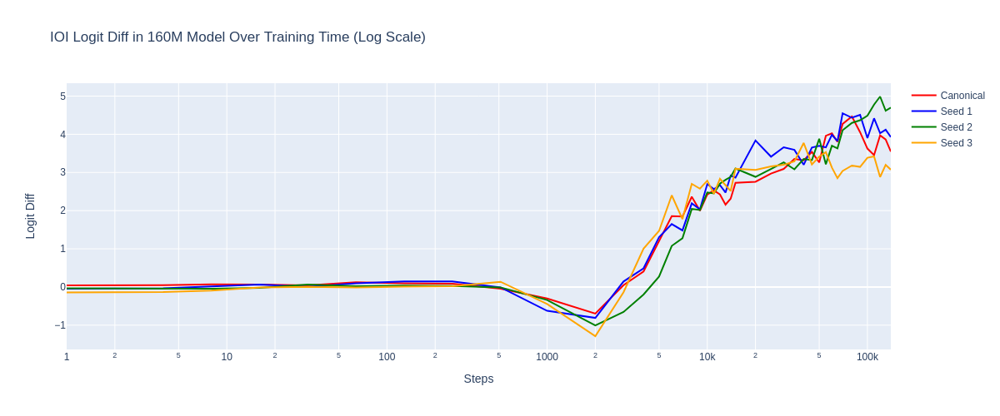

In [ ]:


data_series = [
    metrics['pythia-160m']['ioi']['logit_diff'],
    metrics['pythia-160m-seed1']['ioi']['logit_diff'],
    metrics['pythia-160m-seed2']['ioi']['logit_diff'],
    metrics['pythia-160m-seed3']['ioi']['logit_diff'],
]
labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Logit Diff in 160M Model Over Training Time (Log Scale)')

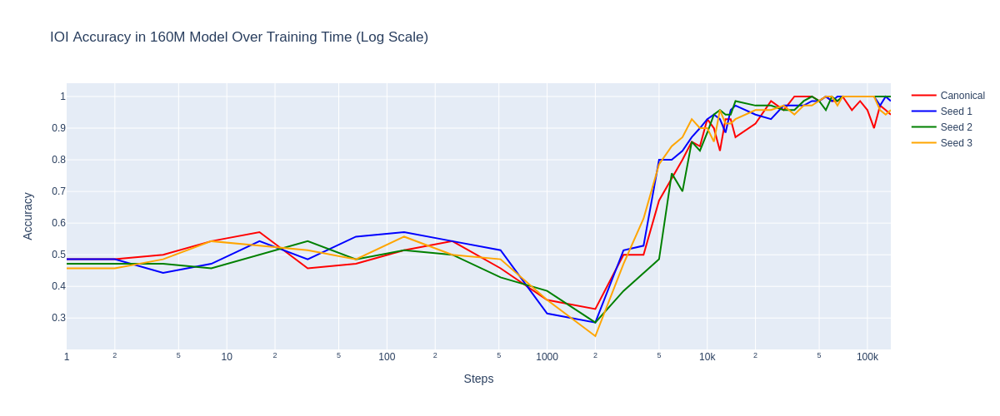

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['accuracy'],
    metrics['pythia-160m-seed1']['ioi']['accuracy'],
    metrics['pythia-160m-seed2']['ioi']['accuracy'],
    metrics['pythia-160m-seed3']['ioi']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='IOI Accuracy in 160M Model Over Training Time (Log Scale)')

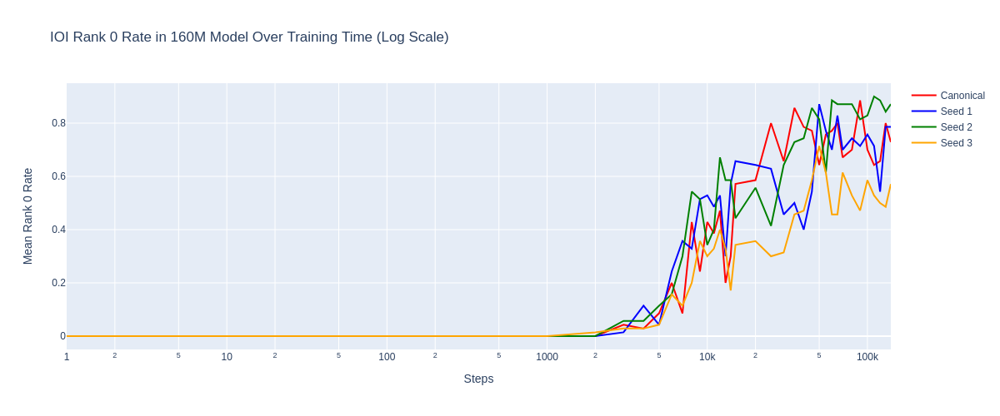

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['rank_0'],
    metrics['pythia-160m-seed1']['ioi']['rank_0'],
    metrics['pythia-160m-seed2']['ioi']['rank_0'],
    metrics['pythia-160m-seed3']['ioi']['rank_0'],

]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Mean Rank 0 Rate', title='IOI Rank 0 Rate in 160M Model Over Training Time (Log Scale)')

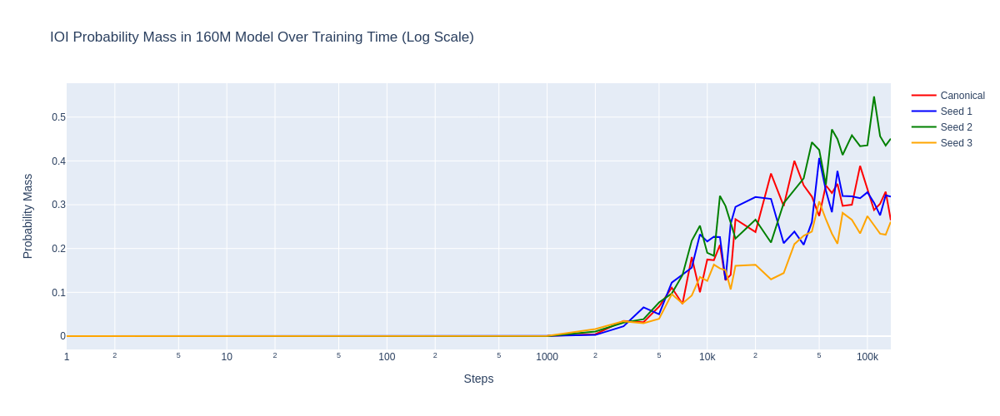

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_mass'],
    metrics['pythia-160m-seed1']['ioi']['probability_mass'],
    metrics['pythia-160m-seed2']['ioi']['probability_mass'],
    metrics['pythia-160m-seed3']['ioi']['probability_mass'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Mass', title='IOI Probability Mass in 160M Model Over Training Time (Log Scale)')

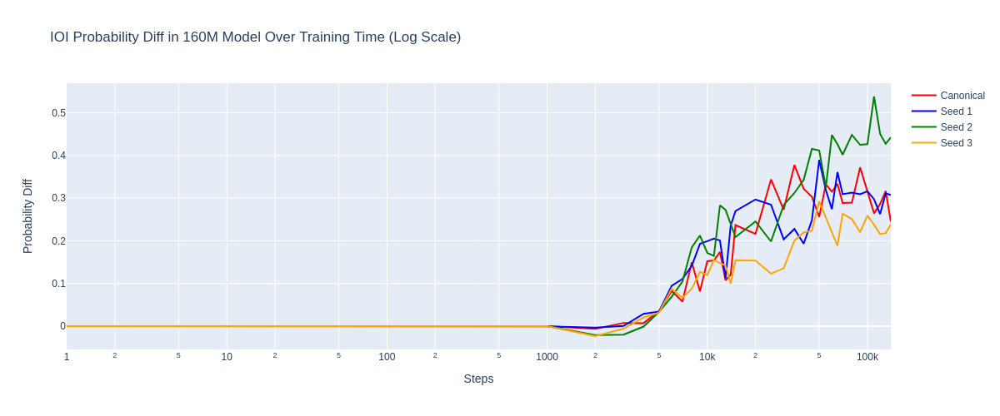

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_diff'],
    metrics['pythia-160m-seed1']['ioi']['probability_diff'],
    metrics['pythia-160m-seed2']['ioi']['probability_diff'],
    metrics['pythia-160m-seed3']['ioi']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='IOI Probability Diff in 160M Model Over Training Time (Log Scale)')

#### Greater-Than

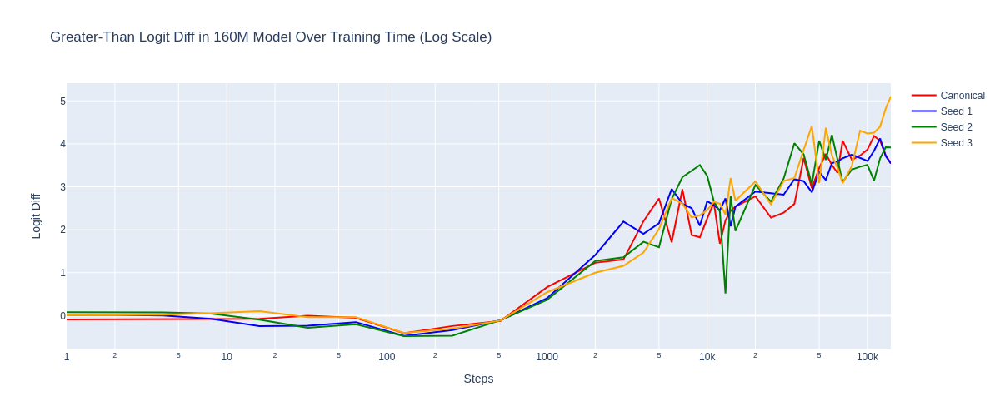

In [ ]:
data_series = [
    metrics['pythia-160m']['greater_than']['logit_diff'],
    metrics['pythia-160m-seed1']['greater_than']['logit_diff'],
    metrics['pythia-160m-seed2']['greater_than']['logit_diff'],
    metrics['pythia-160m-seed3']['greater_than']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Greater-Than Logit Diff in 160M Model Over Training Time (Log Scale)')

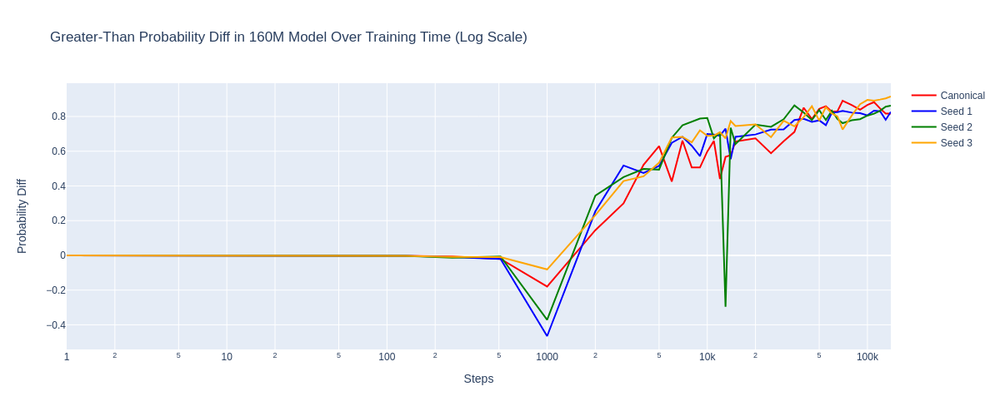

In [ ]:
data_series = [
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-160m-seed1']['greater_than']['prob_diff'],
    metrics['pythia-160m-seed2']['greater_than']['prob_diff'],
    metrics['pythia-160m-seed3']['greater_than']['prob_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Greater-Than Probability Diff in 160M Model Over Training Time (Log Scale)')

#### Sentiment Completion

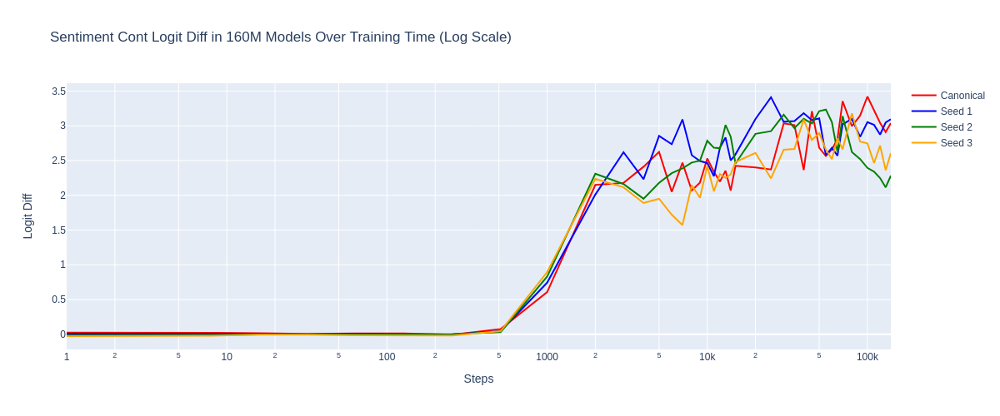

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-seed1']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-seed2']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-seed3']['sentiment_cont']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Cont Logit Diff in 160M Models Over Training Time (Log Scale)')

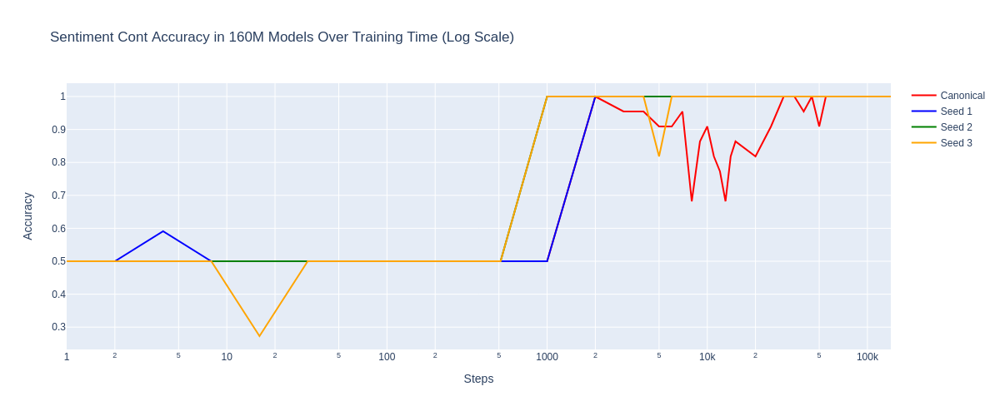

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-seed1']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-seed2']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-seed3']['sentiment_cont']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Cont Accuracy in 160M Models Over Training Time (Log Scale)')

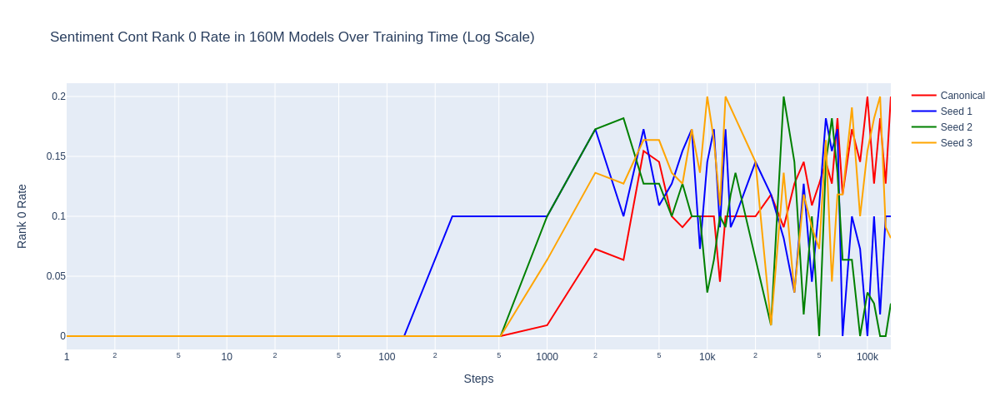

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-seed1']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-seed2']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-seed3']['sentiment_cont']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Cont Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

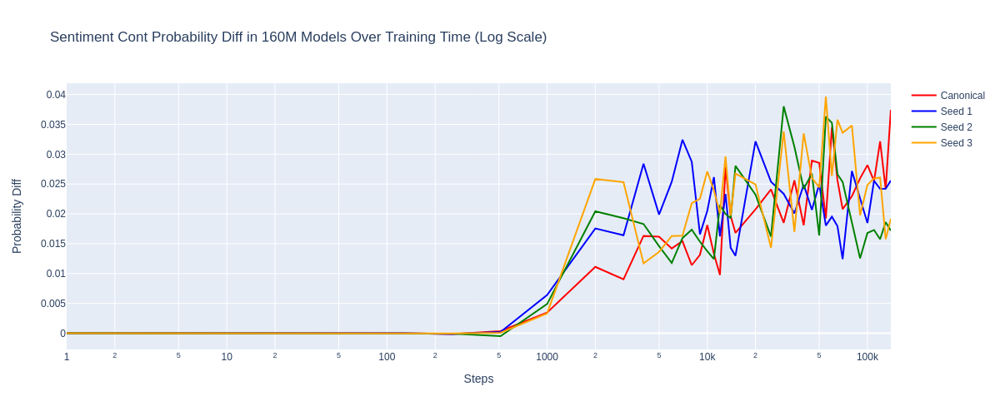

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-seed1']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-seed2']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-seed3']['sentiment_cont']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Cont Probability Diff in 160M Models Over Training Time (Log Scale)')

#### Sentiment Classification

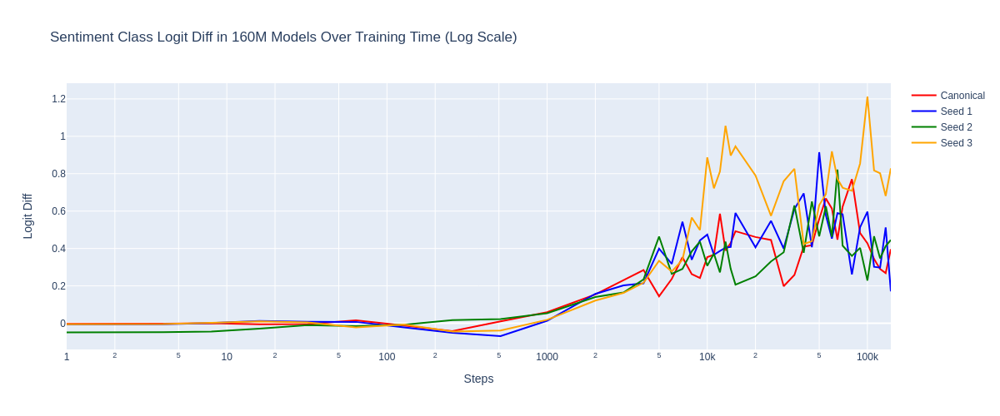

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-seed1']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-seed2']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-seed3']['sentiment_class']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Class Logit Diff in 160M Models Over Training Time (Log Scale)')

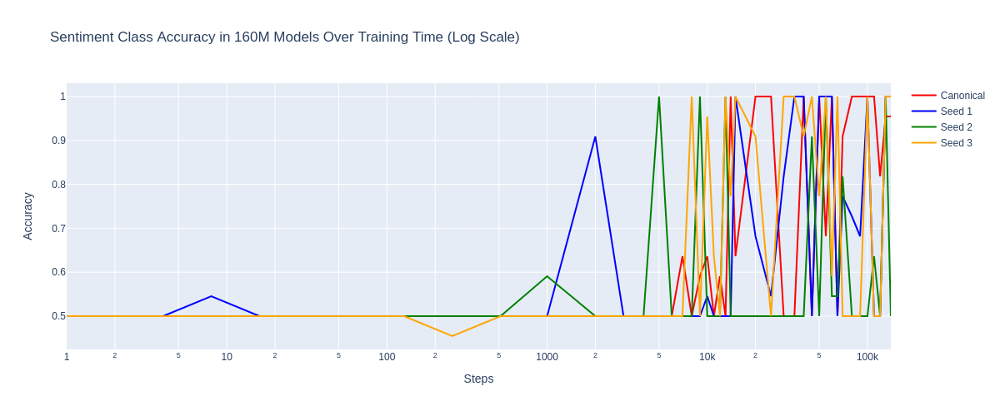

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['accuracy'],
    metrics['pythia-160m-seed1']['sentiment_class']['accuracy'],
    metrics['pythia-160m-seed2']['sentiment_class']['accuracy'],
    metrics['pythia-160m-seed3']['sentiment_class']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3'] 
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Class Accuracy in 160M Models Over Training Time (Log Scale)')

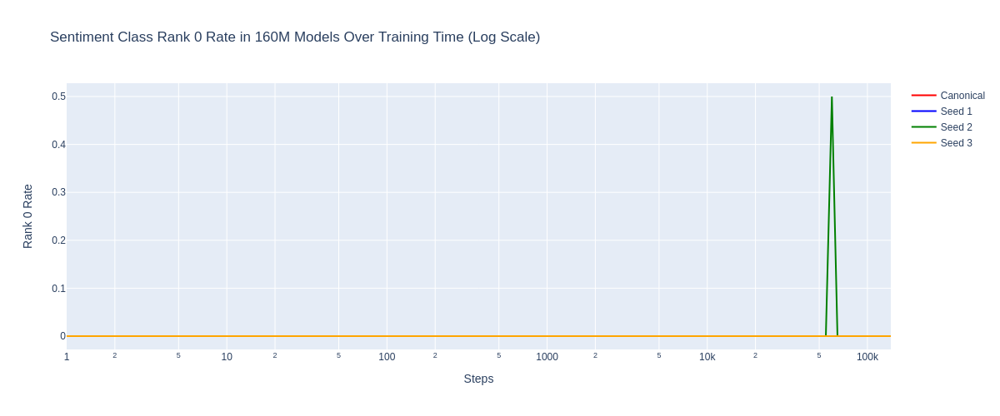

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['rank_0'],
    metrics['pythia-160m-seed1']['sentiment_class']['rank_0'],
    metrics['pythia-160m-seed2']['sentiment_class']['rank_0'],
    metrics['pythia-160m-seed3']['sentiment_class']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Class Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

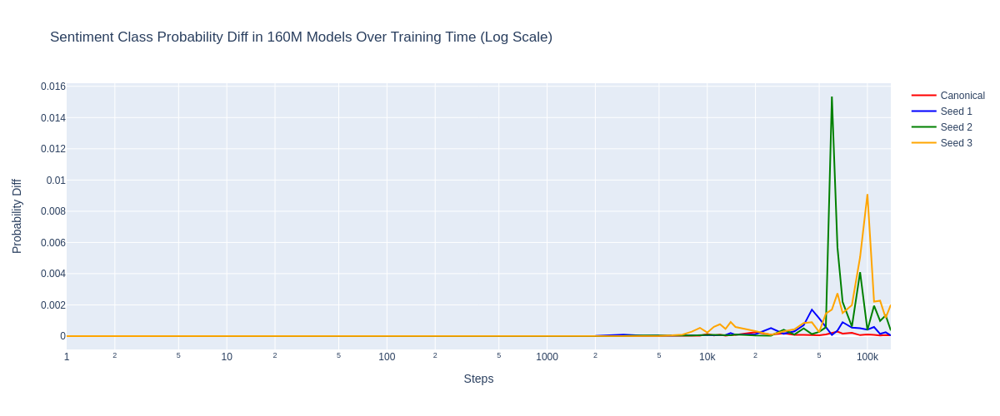

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-seed1']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-seed2']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-seed3']['sentiment_class']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Class Probability Diff in 160M Models Over Training Time (Log Scale)')

### Seeds for Weights Only

#### IOI

In [ ]:
ckpts = get_checkpoint_names("exp_plus_detail")

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['logit_diff'],
    metrics['pythia-160m-weight-seed1']['ioi']['logit_diff'],
    metrics['pythia-160m-weight-seed2']['ioi']['logit_diff'],
    metrics['pythia-160m-weight-seed3']['ioi']['logit_diff'],
]
labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Logit Diff in 160M Model Over Training Time (Log Scale)')

In [ ]:
all_model_weight_seeds_logit_diff = torch.cat(
    (
        metrics['pythia-160m']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed1']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed2']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed3']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:]
    ), dim=0
)
# get the standard deviation of the logit diff
all_model_weight_seeds_logit_diff.std()

tensor(0.4266)

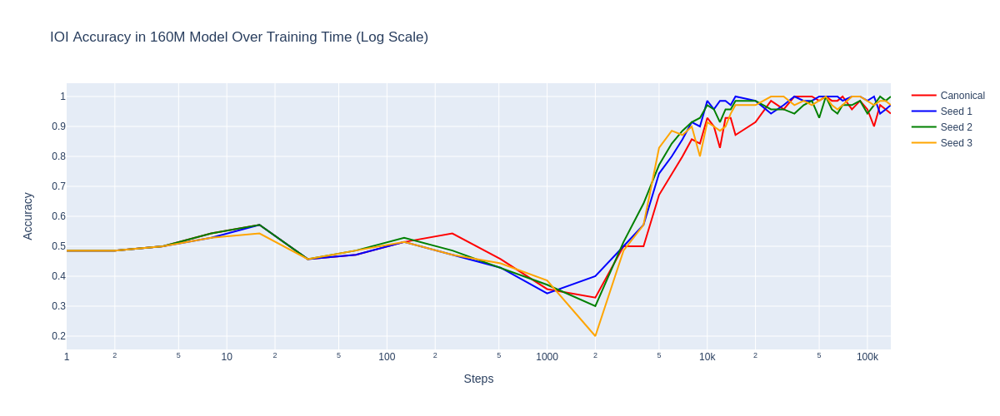

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['accuracy'],
    metrics['pythia-160m-weight-seed1']['ioi']['accuracy'],
    metrics['pythia-160m-weight-seed2']['ioi']['accuracy'],
    metrics['pythia-160m-weight-seed3']['ioi']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='IOI Accuracy in 160M Model Over Training Time (Log Scale)')

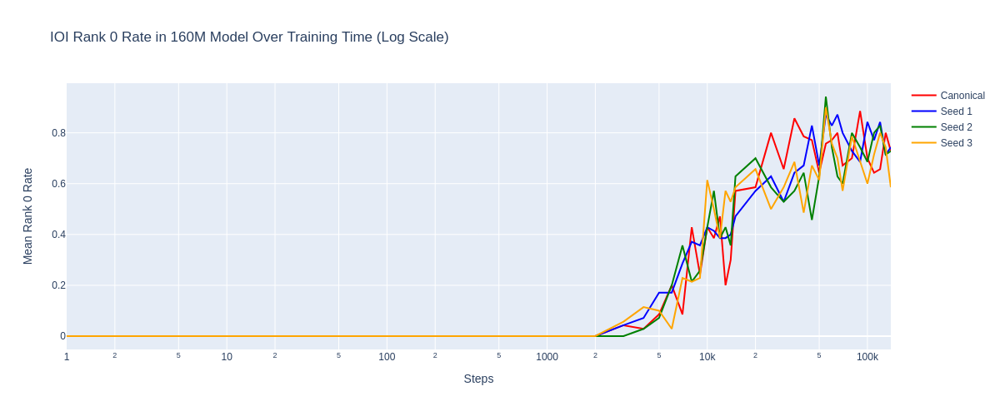

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['rank_0'],
    metrics['pythia-160m-weight-seed1']['ioi']['rank_0'],
    metrics['pythia-160m-weight-seed2']['ioi']['rank_0'],
    metrics['pythia-160m-weight-seed3']['ioi']['rank_0'],

]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Mean Rank 0 Rate', title='IOI Rank 0 Rate in 160M Model Over Training Time (Log Scale)')

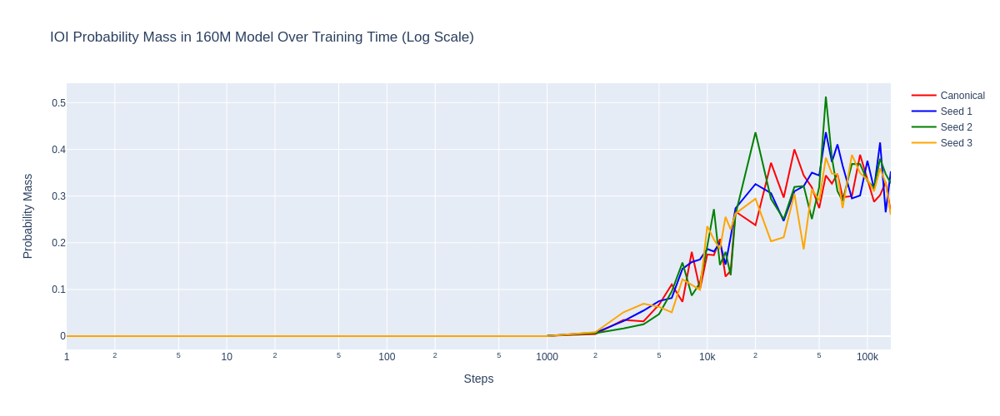

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_mass'],
    metrics['pythia-160m-weight-seed1']['ioi']['probability_mass'],
    metrics['pythia-160m-weight-seed2']['ioi']['probability_mass'],
    metrics['pythia-160m-weight-seed3']['ioi']['probability_mass'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Mass', title='IOI Probability Mass in 160M Model Over Training Time (Log Scale)')

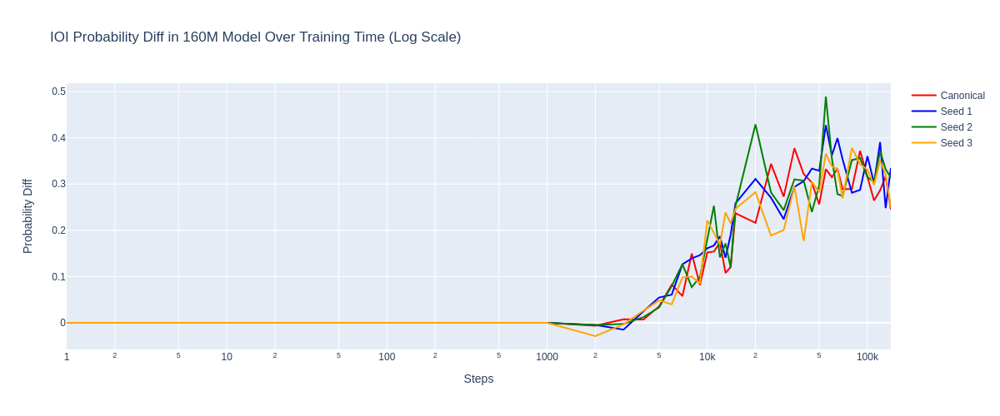

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_diff'],
    metrics['pythia-160m-weight-seed1']['ioi']['probability_diff'],
    metrics['pythia-160m-weight-seed2']['ioi']['probability_diff'],
    metrics['pythia-160m-weight-seed3']['ioi']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='IOI Probability Diff in 160M Model Over Training Time (Log Scale)')

In [ ]:
all_model_weight_seeds_prob_diff = torch.cat(
    (
        metrics['pythia-160m']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed1']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed2']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed3']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:]
    ), dim=0
)
# get the standard deviation of the probability diff
all_model_weight_seeds_prob_diff.std()

tensor(0.0401)

#### Greater-Than

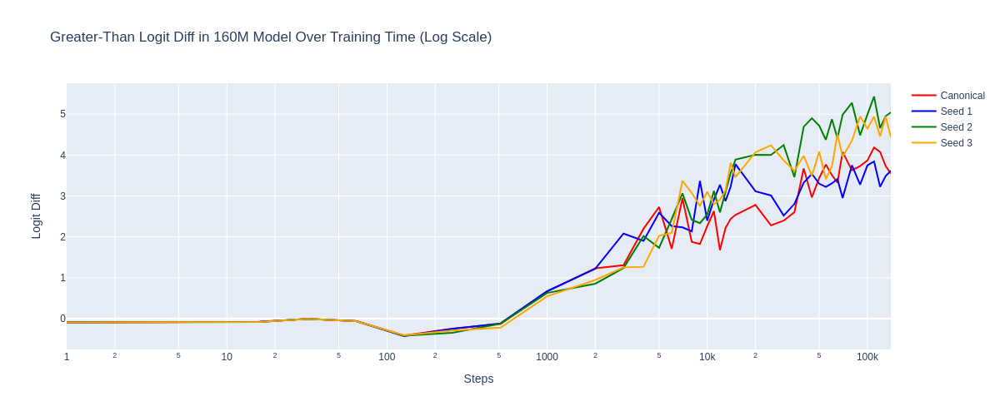

In [ ]:
data_series = [
    metrics['pythia-160m']['greater_than']['logit_diff'],
    metrics['pythia-160m-weight-seed1']['greater_than']['logit_diff'],
    metrics['pythia-160m-weight-seed2']['greater_than']['logit_diff'],
    metrics['pythia-160m-weight-seed3']['greater_than']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Greater-Than Logit Diff in 160M Model Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-160m-weight-seed1']['greater_than']['prob_diff'],
    metrics['pythia-160m-weight-seed2']['greater_than']['prob_diff'],
    metrics['pythia-160m-weight-seed3']['greater_than']['prob_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Greater-Than Probability Diff in 160M Model Over Training Time (Log Scale)')

In [ ]:
all_model_weight_seeds_prob_diff = torch.cat(
    (
        metrics['pythia-160m']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed1']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed2']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:], 
        metrics['pythia-160m-weight-seed3']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:]
    ), dim=0
)
# get the standard deviation of the probability diff
all_model_weight_seeds_prob_diff.std()

tensor(0.0484)

#### Sentiment Completion

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-weight-seed1']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-weight-seed2']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-weight-seed3']['sentiment_cont']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Cont Logit Diff in 160M Models Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-weight-seed1']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-weight-seed2']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-weight-seed3']['sentiment_cont']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Cont Accuracy in 160M Models Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-weight-seed1']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-weight-seed2']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-weight-seed3']['sentiment_cont']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Cont Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-weight-seed1']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-weight-seed2']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-weight-seed3']['sentiment_cont']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Cont Probability Diff in 160M Models Over Training Time (Log Scale)')

#### Sentiment Classification

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-weight-seed1']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-weight-seed2']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-weight-seed3']['sentiment_class']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Class Logit Diff in 160M Models Over Training Time (Log Scale)')

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['accuracy'],
    metrics['pythia-160m-weight-seed1']['sentiment_class']['accuracy'],
    metrics['pythia-160m-weight-seed2']['sentiment_class']['accuracy'],
    metrics['pythia-160m-weight-seed3']['sentiment_class']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3'] 
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Class Accuracy in 160M Models Over Training Time (Log Scale)')

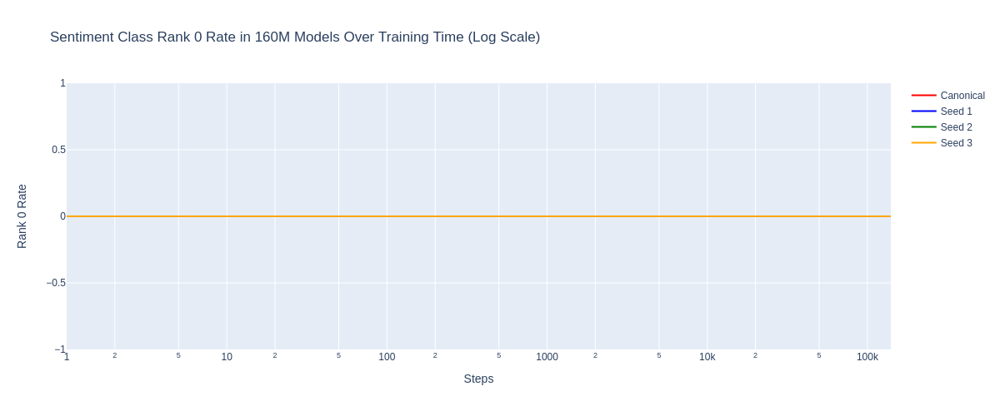

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['rank_0'],
    metrics['pythia-160m-weight-seed1']['sentiment_class']['rank_0'],
    metrics['pythia-160m-weight-seed2']['sentiment_class']['rank_0'],
    metrics['pythia-160m-weight-seed3']['sentiment_class']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Class Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

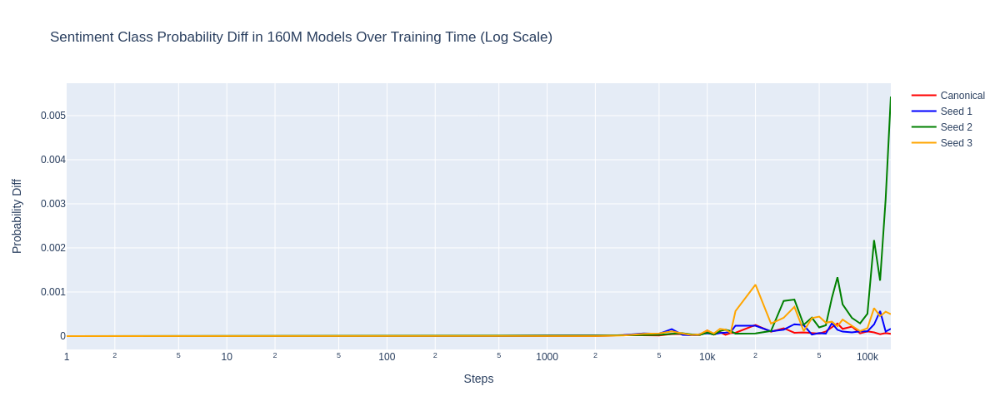

In [ ]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-weight-seed1']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-weight-seed2']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-weight-seed3']['sentiment_class']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Class Probability Diff in 160M Models Over Training Time (Log Scale)')

### Seeds for Data Only

In [ ]:
ckpts = get_checkpoint_names("exp_plus_detail")

#### IOI

In [ ]:


data_series = [
    metrics['pythia-160m']['ioi']['logit_diff'],
    metrics['pythia-160m-data-seed1']['ioi']['logit_diff'],
    metrics['pythia-160m-data-seed2']['ioi']['logit_diff'],
    metrics['pythia-160m-data-seed3']['ioi']['logit_diff'],
]
labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='IOI Logit Diff in 160M Models Over Training Time (Log Scale)')

In [ ]:
all_model_data_seeds_logit_diff = torch.cat(
    (
        metrics['pythia-160m']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed1']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed2']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed3']['ioi']['logit_diff'][ST_DEV_SAMPLE_IDX:],
    ), dim=0
)
# get the standard deviation of the logit diff
all_model_data_seeds_logit_diff.std()

tensor(0.3785)

In [ ]:
data_series = [
    metrics['pythia-160m']['ioi']['accuracy'],
    metrics['pythia-160m-data-seed1']['ioi']['accuracy'],
    metrics['pythia-160m-data-seed2']['ioi']['accuracy'],
    metrics['pythia-160m-data-seed3']['ioi']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='IOI Accuracy in 160M Models Over Training Time (Log Scale)')

NameError: name 'ckpts' is not defined

In [11]:
data_series = [
    metrics['pythia-160m']['ioi']['rank_0'],
    metrics['pythia-160m-data-seed1']['ioi']['rank_0'],
    metrics['pythia-160m-data-seed2']['ioi']['rank_0'],
    metrics['pythia-160m-data-seed3']['ioi']['rank_0'],

]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Mean Rank 0 Rate', title='IOI Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

NameError: name 'ckpts' is not defined

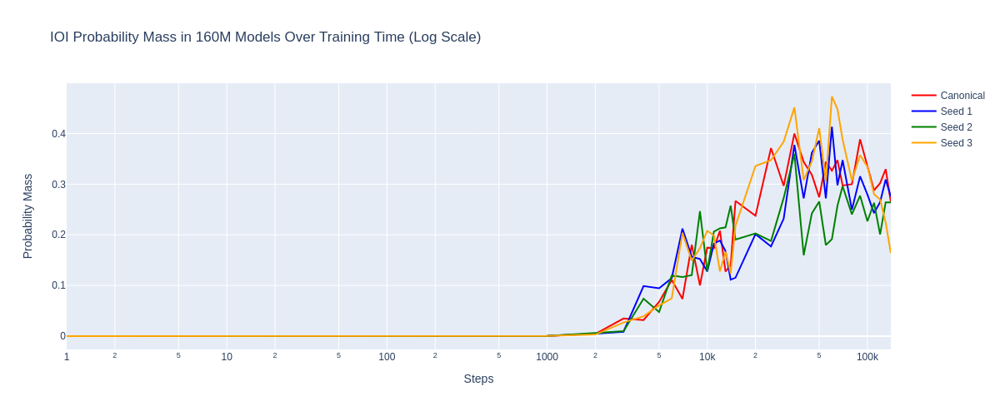

In [142]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_mass'],
    metrics['pythia-160m-data-seed1']['ioi']['probability_mass'],
    metrics['pythia-160m-data-seed2']['ioi']['probability_mass'],
    metrics['pythia-160m-data-seed3']['ioi']['probability_mass'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Mass', title='IOI Probability Mass in 160M Models Over Training Time (Log Scale)')

In [248]:
data_series = [
    metrics['pythia-160m']['ioi']['probability_diff'],
    metrics['pythia-160m-data-seed1']['ioi']['probability_diff'],
    metrics['pythia-160m-data-seed2']['ioi']['probability_diff'],
    metrics['pythia-160m-data-seed3']['ioi']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='IOI Probability Diff in 160M Models Over Training Time (Log Scale)')

In [249]:
all_model_data_seeds_prob_diff = torch.cat(
    (
        metrics['pythia-160m']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed1']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed2']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed3']['ioi']['probability_diff'][ST_DEV_SAMPLE_IDX:],
    ), dim=0
)

all_model_data_seeds_prob_diff.std()

tensor(0.0645)

#### Greater-Than

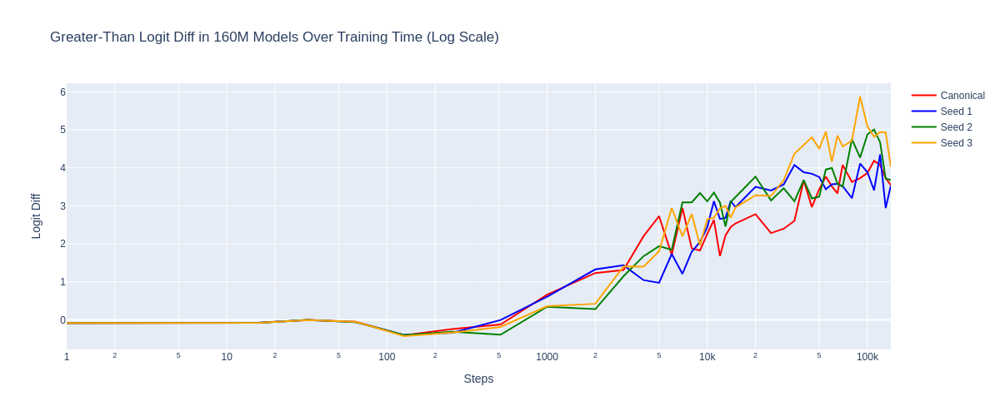

In [144]:
data_series = [
    metrics['pythia-160m']['greater_than']['logit_diff'],
    metrics['pythia-160m-data-seed1']['greater_than']['logit_diff'],
    metrics['pythia-160m-data-seed2']['greater_than']['logit_diff'],
    metrics['pythia-160m-data-seed3']['greater_than']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Greater-Than Logit Diff in 160M Models Over Training Time (Log Scale)')

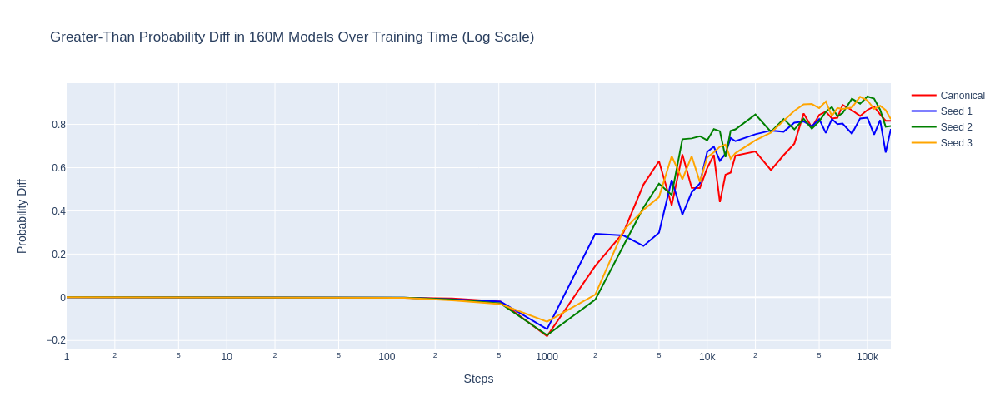

In [145]:
data_series = [
    metrics['pythia-160m']['greater_than']['prob_diff'],
    metrics['pythia-160m-data-seed1']['greater_than']['prob_diff'],
    metrics['pythia-160m-data-seed2']['greater_than']['prob_diff'],
    metrics['pythia-160m-data-seed3']['greater_than']['prob_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Greater-Than Probability Diff in 160M Models Over Training Time (Log Scale)')

In [259]:
all_model_data_seeds_gt_prob_diff = torch.cat(
    (
        metrics['pythia-160m']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed1']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed2']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed3']['greater_than']['prob_diff'][ST_DEV_SAMPLE_IDX:],
    ), dim=0
)

all_model_data_seeds_gt_prob_diff.std()

tensor(0.0528)

#### Sentiment Completion

In [269]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-data-seed1']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-data-seed2']['sentiment_cont']['logit_diff'],
    metrics['pythia-160m-data-seed3']['sentiment_cont']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Cont Logit Diff in 160M Models Over Training Time (Log Scale)')

In [270]:
all_model_data_seeds_sc_logit_diff = torch.cat(
    (
        metrics['pythia-160m']['sentiment_cont']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed1']['sentiment_cont']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed2']['sentiment_cont']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed3']['sentiment_cont']['logit_diff'][ST_DEV_SAMPLE_IDX:],
    ), dim=0
)

all_model_data_seeds_sc_logit_diff.std()

tensor(0.4720)

In [271]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-data-seed1']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-data-seed2']['sentiment_cont']['accuracy'],
    metrics['pythia-160m-data-seed3']['sentiment_cont']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Cont Accuracy in 160M Models Over Training Time (Log Scale)')

In [272]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-data-seed1']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-data-seed2']['sentiment_cont']['rank_0'],
    metrics['pythia-160m-data-seed3']['sentiment_cont']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Cont Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

In [273]:
data_series = [
    metrics['pythia-160m']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-data-seed1']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-data-seed2']['sentiment_cont']['probability_diff'],
    metrics['pythia-160m-data-seed3']['sentiment_cont']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']
plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Cont Probability Diff in 160M Models Over Training Time (Log Scale)')

#### Sentiment Classification

In [274]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-data-seed1']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-data-seed2']['sentiment_class']['logit_diff'],
    metrics['pythia-160m-data-seed3']['sentiment_class']['logit_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Logit Diff', title='Sentiment Class Logit Diff in 160M Models Over Training Time (Log Scale)')

In [275]:
all_model_data_seeds_scl_logit_diff = torch.cat(
    (
        metrics['pythia-160m']['sentiment_class']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed1']['sentiment_class']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed2']['sentiment_class']['logit_diff'][ST_DEV_SAMPLE_IDX:],
        metrics['pythia-160m-data-seed3']['sentiment_class']['logit_diff'][ST_DEV_SAMPLE_IDX:],
    ), dim=0
)

all_model_data_seeds_scl_logit_diff.std()

tensor(0.2281)

In [276]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['accuracy'],
    metrics['pythia-160m-data-seed1']['sentiment_class']['accuracy'],
    metrics['pythia-160m-data-seed2']['sentiment_class']['accuracy'],
    metrics['pythia-160m-data-seed3']['sentiment_class']['accuracy'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3'] 
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Accuracy', title='Sentiment Class Accuracy in 160M Models Over Training Time (Log Scale)')

In [277]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['rank_0'],
    metrics['pythia-160m-data-seed1']['sentiment_class']['rank_0'],
    metrics['pythia-160m-data-seed2']['sentiment_class']['rank_0'],
    metrics['pythia-160m-data-seed3']['sentiment_class']['rank_0'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Rank 0 Rate', title='Sentiment Class Rank 0 Rate in 160M Models Over Training Time (Log Scale)')

In [278]:
data_series = [
    metrics['pythia-160m']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-data-seed1']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-data-seed2']['sentiment_class']['probability_diff'],
    metrics['pythia-160m-data-seed3']['sentiment_class']['probability_diff'],
]

labels = ['Canonical', 'Seed 1', 'Seed 2', 'Seed 3']
colors = ['red', 'blue', 'green', 'orange']

plot_lines(data_series, labels, colors, x_vals=ckpts, x_title='Steps', y_title='Probability Diff', title='Sentiment Class Probability Diff in 160M Models Over Training Time (Log Scale)')